In [1]:
%%HTML
<script src="require.js"></script>

In [2]:
from IPython.display import HTML
HTML('''<script src="https://cdnjs.cloudflare.com/ajax/libs/jquery/2.0.3/jquery.min.js "></script><script>
code_show=true; 
function code_toggle() {
if (code_show){
$('div.jp-CodeCell > div.jp-Cell-inputWrapper').hide();
} else {
$('div.jp-CodeCell > div.jp-Cell-inputWrapper').show();
}
code_show = !code_show
} 
$( document ).ready(code_toggle);</script><form action="javascript:code_toggle()"><input type="submit" value="Toggle on/off for raw code"></form>
''')

In [3]:
# IMPORT LIBRARIES
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import RandomOverSampler
from sklearn.preprocessing import RobustScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.preprocessing import LabelEncoder
import shap
from lime.lime_tabular import LimeTabularExplainer
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings


# Suppress warnings
warnings.filterwarnings('ignore')

![Cover Image](title.png)

<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;">Abstract</h1>

The Volleyball Nations League (VNL) is one of the most prestigious international leagues in the field of volleyball. Each season, national teams play a series of matches, ending in a final tournament to compete for the championship. The VNL chose the Philippines to host a few of its matches this coming June 2024 due to the country's growing fan base. The growing popularity of volleyball in the country, along with the abundance of data in the sports industry, paved way for the researchers of this project to leverage on various machine learning techniques to create a model with the goal of predicting VNL match outcomes. Detailed match, team, and player data from the 2023 VNL season will be used to train the machine learning model.

Given the growing market size of the sports betting industry, the researchers thought of linking the power of machine learning (ML) models to the formulation of betting odds. To cater to betting odds on the win-lose level and set level, the researchers created two ML models: Bet Smart and Bet Smarter, respectively. The methodology encompasses data collection from various online sources, rigorous data preprocessing, exploratory data analysis (EDA) to uncover significant predictors, and the standard approach to finding the best model that fits the dataset. Model performance metrics were used to assess the predictive power of both models.

<p style="text-align: center;"><strong>Model Performance Metric</strong></p>

<div style="display: flex; justify-content: center;">
<table border="1" style="width: 70%;">
  <tr>
    <th style="text-align: center; font-weight: bold;">Metric</th>
    <th style="text-align: center; font-weight: bold;">Bet Smart (Win-Lose Model)</th>
    <th style="text-align: center; font-weight: bold;">Bet Smarter (Set-Score Model)</th>
  </tr>
  <tr>
    <td style="text-align: center;">Accuracy</td>
    <td style="text-align: center;">93.85%</td>
    <td style="text-align: center;">73.20%</td>
  </tr>
  <tr>
    <td style="text-align: center;">Precision</td>
    <td style="text-align: center;">93.10%</td>
    <td style="text-align: center;">73.80%</td>
  </tr>
  <tr>
    <td style="text-align: center;">Recall</td>
    <td style="text-align: center;">95.00%</td>
    <td style="text-align: center;">71.25%</td>
  </tr>
  <tr>
    <td style="text-align: center;">F1 Score</td>
    <td style="text-align: center;">93.66%</td>
    <td style="text-align: center;">71.67%</td>
  </tr>
</table>
</div>


The model performance of Bet Smart is exceptionally well; however, Bet Smarter's performance is low as more outcomes are being predicted under this model. With this, interpretative methods like SHAP and LIME provide insights into the decision-making processes of the models, ensuring transparency and enhancing trust in the predictions. Both models' predictions, the insights gathered from model interpretability techniques, and the domain expertise of the sports betting operator can help create informed decisions for the betting odds. This will, in turn, provide bettors with more attractive betting odds; thus, increasing customer retention. 

The models were tested on recent VNL matches and favorable results were seen. It is important to note that both models base the predictions off of historical player statistics. External factors such as team strategy, player injuries, and the like are not considered. The researchers recommend the following for future studies:

In improving the predictive models for the Volleyball Nations League (VNL), we have identified some possible areas of enhancement. These recommendations aim to fine-tune our models to make them more accurate and effective, as well as add to the business value. 
1. Regular update of team standings and player profiles
2. Determine optimal timeline for retraining
3. Inclusion of temporal and qualitative features*
4. Explore DICE counterfactuals for additional business value
5. Implementation of win outcome on set-level granularity

The models created are expected to offer substantial contributions to the sports betting industry, particularly by optimizing betting strategies and providing a deeper understanding of game dynamics in professional volleyball.

<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;">Introduction</h1>

<h2 style="color:#4d0077; text-align:left; text-transform: uppercase;"> Volleyball Nations League </h2>

The Volleyball Nations League (VNL) is one of the most prestigious international leagues in the field of volleyball. Established in 2018 by the Fédération Internationale de Volleyball (FIVB), the VNL brings together the best national teams from around the world to compete in an annual tournament.

The VNL features both men's and women's competitions, showcasing top volleyball talent and encouraging global interest in the sport. Each season, national teams play a series of matches, ending in a final tournament where the best teams compete for the championship.

Beyond its competitive aspect, the VNL is a critical platform for national teams as they prepare for major international events. Importantly, the VNL acts as a qualifier for the upcoming Paris 2024 Olympics, making it a key part of the volleyball calendar. Teams that do well in the VNL earn ranking points and positions that can help them secure a place in the Olympics, adding excitement and importance to each match.

<h2 style="color:#4d0077; text-align:left; text-transform: uppercase;"> Volleyball in the Philippines </h2>

The Philippines has embraced the VNL with great enthusiasm, hosting the event for two consecutive years and showing the country's growing passion for volleyball. This interest is further highlighted by the recent success of the Philippine national team, Alas Pilipinas, which won its first medal in the Asian Volleyball Cup after 63 years, marking a historic achievement for the sport in the country [[1]](https://www.onesports.ph/alas/article/21663/in-photos-alas-pilipinas-makes-history-with-first-avc-medal-in-63-years).

With the growing popularity of volleyball and the wealth of data generated from these competitions, there is a unique opportunity to leverage this information for advanced analytical studies. The abundance of detailed match data provides a good start for applying machine learning techniques to predict match outcomes, offering insights that can enhance team strategies and fan engagement.

<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;">Problem Statement and Motivation</h1>

<h2 style="color:#4d0077; text-align:left; text-transform: uppercase;"> Sports Analytics </h2>

Sports analytics, specifically in volleyball, is becoming highly relevant as continuous innovations arise from the abundance of data. The use of advanced analytics has become increasingly important as it provides both coaches and teams with tools to analyze player performance, optimize training, and gain competitive advantage. For example, historical player performance statistics are now available to help coaches identify areas of improvement for each player [[2]](https://kinexon-sports.com/blog/volleyball-performance-tracking-in-action/). This will enable targeted training and skill development, which will lead to enhanced player performance and greater contribution to the team’s overall performance. 

In the age of digitalization, sport analytics is experiencing a shift from simple instinct and intuition. Although human intervention from coaches and domain experts still plays a vital role in a team’s success, there is an ever-increasing emphasis on sports analytics given the amount of data that can be analyzed in this day and age. To illustrate, Volley metrics is an analytics platform that provides a global database of player data [[3]](https://www.zibtek.com/projects/volley-metrics). In this way, coaches can identify top talent and recruit these players depending on their team’s needs. KINEXON is another volleyball analytics platform that offers a range of metrics including jump analytics and injury prevention [[4]](https://kinexon-sports.com/blog/volleyball-analytics/). This will provide a detailed understanding of player performance, which will help coaches make informed decisions.  

Indeed, various innovations are still on the rise in the field of sports analytics, but these are not meant to replace traditional coaching instincts; instead, they are meant to complement them [[5]](https://www.avca.org/blog/the-guide-to-developing-an-analytics-strategy/). Coaches themselves can use these data to create data-driven decisions and more informed decisions when it comes to player selection, strategy, and training. This will give them a competitive edge over those that do not leverage advanced analytics. 

<h2 style="color:#4d0077; text-align:left; text-transform: uppercase;"> Industry Analysis – Sports Betting Industry </h2>

According to Statista, the market size of the sports betting and lottery sector worldwide has reached 242 billion USD in 2023 [[6]](https://www.statista.com/statistics/1186240/sports-betting-and-lottery-industry-market-size-global/). While it is noted that this market size includes the lottery sector, this gives us a snapshot on how enormous the industry is.

<img src="Fig1.PNG" alt="Market size of sports betting worldwide from 2013 to 2022" width="600" height="auto"/>

In Asia Pacific alone, the Sports betting market went up to 28 billion USD in 2023 and is expected to reach USD 60.34 billion by 2030 with a compounded annual growth rate (CAGR) of 11.5% [[7]](https://www.researchandmarkets.com/report/asia-pacific-sports-betting-market?utm_source=GNE&utm_medium=PressRelease&utm_code=p34ptw&utm_campaign=1953821+-+Asia-Pacific+Sports+Betting+Market+Report+2024-2030%2c+Featuring+Dafabet%2c+SBOBET%2c+1xBet%2c+TAB%2c+CrownBet%2c+UBET%2c+Sports+Toto+Malaysia%2c+Mansion88%2c+12BET+and+W88&utm_exec=carimspi).

<img src="Fig2.PNG" alt="Asia Pacific sports betting market" width="600" height="auto"/>

Furthermore, according to a report from MarketrResearchGuru.com, Philippines is one of the top countries that are leading the volleyball betting market in Asia Pacific [[8]](https://www.linkedin.com/pulse/volleyball-betting-market-exploring-present-patterns-3i9wc/). Which means that the country is among the top 27% (Top 10 out of 36) when it comes to Volleyball sports betting in the region. This is relevant to this study given that the VNL consists of 16 countries and the second majority of which are coming from Asia (China, Japan, Korea, Thailand). 

It is also worth noting that the shift towards online sports betting in the Asia Pacific may also be attributed to a more secured payment options and having the ability of users to manage their accounts online which was enhanced during the pandemic. 

With this industry analysis, we can therefore conclude that the market is bullish and may be a good idea to invest in with the right Machine Learning methods/algorithms. 

<h2 style="color:#4d0077; text-align:left; text-transform: uppercase;"> Integrating Machine Learning in The Sports Betting Industry</h2>

Machine learning (ML) algorithms can be used to help sports betting operators create more informed and competitive betting odds. Providing bettors with more attractive and fun betting odds can increase the number of bets taken; thus, increasing profitability. Apart from ML having the capacity to predict volleyball match outcomes through analyzing player performance statistics, it can also generate information on how it created these predictions through model interpretability techniques. This provides a vast opportunity to leverage ML in the sports betting industry. 

Oddsmatrix, which is a leading sports data provider, makes sports betting operators’ jobs easy and automated [[9]](https://oddsmatrix.com/machine-learning-sports-betting/). It integrates the necessary data directly into the platform so that betting operators can incorporate it in their own workflows, using it to set and adjust odds based on varying market trends. OddsMatrix is a reputable data provider by giving a constant flux of accurate odds data so betting operators can remain competitive and increase customer retention. This platform also provides security tools and solutions to acquire new customers and expand into new markets. 

ML models can help sports betting operators manage risk by identifying potential upsets. Models also have the capability to provide insight on which factors contribute the most to a team’s win. Using this information, the betting odds can be adjusted accordingly given the fast-moving business environment of the sports betting industry. This can help mitigate losses and ensure a more stable business. 

<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;">Methodology</h1>

This project followed the standard methodology to find the best model that fits the dataset. Below are the key steps to achieve the goal of predicting outcomes for the Volleyball Nations League (VNL) 2024 matches.

![Cover Image](methodology.png)

**1. Web Scraping:**

This involved scraping data from the official Volleyball World website (link here) using python libraries such as requests and BeautifulSoup. This included collecting team standings and match results for the 2023 VNL season. Additionally, team rosters for 2023 were compiled from Zakir Pasha’s GitHub (link here) repository and verified against official sources. For prediction purposes, 2024 team rosters were scraped and verified. 

**2. Exploratory Data Analysis (EDA) and Data Preprocessing::**

This step involved cleaning and structuring the raw data to address missing values and adjusting data types. This includes aggregating match-level data, including player statistics and team standings. Subsequently, the data underwent summarization and visualization to uncover key patterns and relationships, leading to the identification of correlations between features such as matches won, points, sets won, and points ratios. 

**3. Split the Dataset:**

A train-test split of 80-20 was done on the dataset. The training dataset was used to look for the best model through Grid Search. The test dataset is used to test the best performing model on unseen data.
 
**4. Grid Search on the Training Dataset:**

Grid search cross validation was used to find the best performing model. The best model was determined through getting the model with the highest test accuracy score.

**5. Validate on the Test Set**

To evaluate the best model, various metrics such as accuracy, precision, recall, and F1-score were utilized. Furthermore, a confusion matrix was used to determine the model's prediction capability based on the goal of the project.

**6. Model Interpretability**

SHAP and LIME were employed for model interpretability, aiding in understanding feature importance and prediction explanations. Before applying these models to predict outcomes for 2024, they were validated on the 2023 data.

<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;">Scope and Limitation</h1>

#### Scope
- The study focuses exclusively on men's Volleyball Nations League (VNL) data for the years 2023 and 2024. 
- The primary goal is to predict match outcomes for the 2024 VNL season using data from the 2023 season for model training and validation. 
- Key factors considered in the predictions include team standings, match results, and player statistics. 
 
#### Limitations
- The analysis is limited to the men's league, excluding any data or trends from the women's league. 
- Predictions are based solely on historical data from the 2023 season, which may not fully account for changes in team dynamics or player performance in 2024. 
- The accuracy of predictions is dependent on the completeness and correctness of the scraped data, which, despite thorough verification, may contain errors. 
- The model does not account for external factors such as injuries, team strategies, or other non-quantifiable elements that could influence match outcomes. 

<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;">List of Tables</h1>

- Table 1.0: Volleyball 2023 Standings Dataset - Column Descriptions
- Table 2.0: Volleyball 2021-2024 Rosters (Men) Dataset - Column Descriptions
- Table 3.0: Volleyball 2023 Match Data (Men) - Column Description
- Table 4.0: Volleyball Nations League 2023 Standings
- Table 5.0: Summary Statistics of Volleyball 2023 Standings Dataset
- Table 5.1: Volleyball 2023 Standings Dataset - Data Types
- Table 5.2: Volleyball 2023 Standings Dataset - Null Values Counts
- Table 5.3: Top 5 Teams based on Points
- Table 6.0: Volleyball 2023 Rosters (Men
- Table 6.1: Summary Statistics of Volleyball Rosters 2023 Dataset
- Table 6.2: Volleyball Rosters 2023 Dataset - Data Types
- Table 6.3: Volleyball Rosters 2023 Dataset - Fixed Data Types
- Table 6.4: Fixed Summary Statistics of Volleyball Rosters 2023 Dataset
- Table 6.5: Volleyball Rosters 2023 Dataset - Null Values Counts
- Table 6.6: Volleyball Rosters 2023 Dataset - Null Data
- Table 7.0: Volleyball 2023 Team Country Profiles
- Table 8.0: Volleyball 2023 Matches
- Table 9.0: Aggregated Matches
- Table 10.0: 2024 Country Team Profiles
- Table 11.0: June 5 Matches Prediction Summary 
- Table 12.0: Win-Loss Level Betting Odds Influenced by Bet Smart
- Table 12.1: LIME Prediction Probability for SLO vs. TUR
- Table 12.2: Set Level Betting Odds Influenced by Bet Smarter

<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;">List of Figures</h1>

- Figure 1.0: Correlation Plots on Features
- Figure 2.0: Player Profiles for Argentina
- Figure 3.0: Player Profiles for Brazil
- Figure 4.0: Player Profiles for Bulgaria
- Figure 5.0: Player Profiles for Canada
- Figure 6.0: Player Profiles for China
- Figure 7.0: Player Profiles for Cuba
- Figure 8.0: Player Profiles for France
- Figure 9.0: Player Profiles for Germany
- Figure 10.0: Player Profiles for Iran
- Figure 11.0: Player Profiles for Italy
- Figure 12.0: Player Profiles for Japan
- Figure 13.0: Player Profiles for Netherlands
- Figure 14.0: Player Profiles for Poland
- Figure 15.0: Player Profiles for Serbia
- Figure 16.0: Player Profiles for Slovenia
- Figure 17.0: Player Profiles for USA
- Figure 18.0: Confusion Matrix for Win/Loss Prediction
- Figure 19.0: Confusion Matrix for Set Score Prediction
- Figure 20.0: SHAP Summary Plot
- Figure 21.0: Top 15 Features
- Figure 22.0: SHAP Sumamry Plot
- Figure 23.0: SHAP Waterafall Plot
- Figure 24.0: LIME Explanation for Features
- Figure 25.0: LIME Explanation for Features - ARG vs USA
- Figure 26.0: LIME Explanation for Features - CAN vs CUB
- Figure 27.0: LIME Explanation for Features - SLO vs TUR
- Figure 28.0: LIME Explanation for Features - SLO vs TUR

<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;">Datasets</h1>

<h2 style="color:#4d0077; text-align:left; text-transform: uppercase;"> 2023 Volleyball Nations League (Men) </h2>

The project will utilize Volleyball Nations League (VNL) data specifically for the year 2023 to preserve relevance and capture the most recent player statistics. Only men's VNL data will be used since the team decided to set the context of the study with the upcoming VNL games to be held here in the Philippines this 2024, which is only the men's league. VNL data that pertains to team standings (i.e. matches, points, sets, rank) and team rosters (i.e. nationality, age, height, efficiency, attacks, blocks, serves) will be used. Furthermore, these data will be combined with the VNL matches that happened last 2023. The final dataset used for modeling will be on match level comprising 2023 matches containing results, countries belonging to team 1, and team 2, player statistics, and team standings for each team.

---
<h2 style="color:#4d0077; text-align:left; text-transform: uppercase;"> Sources </h2>

- **Matches Dataset:** The data was scraped using Python libraries such as Beautiful Soup from the official Volleyball World website. Specifically, the men's world ranking information was sourced from world ranking page [[11]](https://en.volleyballworld.com/volleyball/world-ranking/men). 

- **2023 Roster Dataset:** This dataset was originally compiled by Zakir Pasha. The existing data and template code from his GitHub repository [[12]](https://github.com/ZakirPasha/Volleyball-Nations-League/blob/main/Mens/Men's%20VNL%20Rosters.ipynb) were verified against the official website for accuracy. 

- **2024 Roster Dataset:** The 2024 roster dataset was scraped from the VNL Men's Roster page [[13]](https://en.volleyballworld.com/volleyball/competitions/volleyball-nations-league/teams/men/) following template code similar to the 2023 roster. Verification and updates were made to ensure the accuracy and completeness of the data based on the official website. This dataset will be used for predicting 2024 match outcomes and *not for model training*.

---
<h3 style="color:#fff; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;"> Volleyball 2023 Standings Dataset </h3>

This dataset provides detailed statistics on the standings of volleyball teams participating in the *2023 Volleyball Nations League (VNL)*. Each entry in the dataset corresponds to a different team's performance throughout the tournament. The dataset includes information on each team's overall ranking, the number of matches played, won, and lost, as well as the specifics of how each match was won or lost (e.g., scores of `3-0`, `3-1`, etc.). 

Additionally, the dataset provides quantitative metrics on the teams' performances in terms of points, sets, and the respective ratios. This data can be used for analysis of team performance, comparison across different teams, and statistical assessments related to the efficiency and effectiveness of the teams throughout the league.

<br>

<div class="alert alert-info">

🔑 **KEY COMPONENTS:**

- `Rank`: Team rankings based on their performance.
- `Matches_Total, Matches_Won, Matches_Lost`: Overview of games played, their outcomes, and details of match scores.
- `Sets and Points Data`: Detailed metrics on sets and points won and lost, which can help in analyzing the closeness of the games and overall team strength.
- `Performance Ratios`: Ratios like Set Ratio and Point Ratio provide a deeper insight into the team’s performance efficiency compared to others.
<br>

</div>

<br>
<p style="text-align: center;"><strong>Table 1.0: Volleyball 2023 Standings Dataset - Column Descriptions</strong></p>

| Feature Name     | Description                                                   | Data Type |
|------------------|---------------------------------------------------------------|-----------|
| Rank             | The position of the team in the league standings.             | Integer   |
| Team             | The name of the volleyball team.                              | Text      |
| Matches_Total    | The total number of matches played by the team.               | Integer   |
| Matches_Won      | The number of matches won by the team.                        | Integer   |
| Matches_Lost     | The number of matches lost by the team.                       | Integer   |
| 3-0              | The number of matches won by the team with a score of 3-0.    | Integer   |
| 3-1              | The number of matches won by the team with a score of 3-1.    | Integer   |
| 3-2              | The number of matches won by the team with a score of 3-2.    | Integer   |
| 2-3              | The number of matches lost by the team with a score of 2-3.   | Integer   |
| 1-3              | The number of matches lost by the team with a score of 1-3.   | Integer   |
| 0-3              | The number of matches lost by the team with a score of 0-3.   | Integer   |
| Points           | The total points accumulated by the team.                     | Integer   |
| Sets_Won         | The total number of sets won by the team.                     | Integer   |
| Sets_Lost        | The total number of sets lost by the team.                    | Integer   |
| Set_Ratio        | The ratio of sets won to sets lost.                           | Float     |
| Points_Won       | The total number of points won by the team.                   | Integer   |
| Points_Lost      | The total number of points lost by the team.                  | Integer   |
| Point_Ratio      | The ratio of points won to points lost.                       | Float     |


---
<h3 style="color:#fff; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;"> Volleyball Rosters (Men) </h3>

This dataset encompasses detailed performance statistics and personal information of male volleyball players over the seasons 2021 to 2024. The dataset includes a variety of metrics such as points scored, efficiency, and average points per match across different modes of scoring (attack, block, serve). It also provides personal attributes like age, height, and nationality, alongside their playing position and unique identifiers. <br><br>



<div class="alert alert-info">

🔑 **KEY COMPONENTS:**
    
**Player Identification and Details**:
   - `No.`: Jersey number, important for identifying players on the field.
   - `Player Name`: Essential for distinguishing between players.
   - `Player_ID`: Unique identifier for each player for record-keeping and analysis.
   - `Position`: Specifies the role of each player in the team, which is critical for performance analysis.<br><br>

**Temporal and Geographical Information**:
   - `Year`: Indicates the season, allowing temporal comparisons and trend analysis.
   - `Country_Name`: The country the player represented, useful for geographic and demographic studies.
   - `Nationality`: Player's nationality, which might differ from the team's country, important for diversity analysis.<br><br>

**Physical Attributes**:
   - `Age`: Provides insights into the experience and physical prime of players.
   - `Height`: Important for analyzing the physical advantages in different positions.<br><br>

**Performance Metrics**:
   - `Total Points`: Total points scored by the player across the season.
   - `Average by Match`: Average points scored per match, indicative of player consistency and effectiveness.
   - `Attack Points`: Specifics on how many points were scored through attacks, highlighting offensive skills.
   - `Efficiency`: Attack efficiency, showing how effectively the player converts plays into points.
   - `Attack Avg Points`: Average attack points per match, useful for assessing offensive contributions.
   - `Block Points`: Points scored through blocks, indicating defensive skills.
   - `Block Success`: Block success rate, which reflects defensive effectiveness.
   - `Block Avg Points`: Average points per match from blocks, providing a measure of defensive contributions.
   - `Serve Points`: Points scored from serves, showing service effectiveness.
   - `Serve Success`: Success rate of serves, important for understanding service strategy and execution.
   - `Serve Avg Points`: Average points per match from serves, indicative of the player's impact from the service line.<br><br>

</div>

<p style="text-align: center;"><strong>Table 2.0: Volleyball Rosters 2021-2024 (Men) Dataset - Column Descriptions</strong></p>

| Feature Name         | Description                                                  | Data Type |
|----------------------|--------------------------------------------------------------|-----------|
| No.                  | Jersey number of the player                                  | Integer   |
| Player Name          | Full name of the player                                      | Text      |
| Position             | Position played by the player on the team                    | Text      |
| Player_ID            | Unique identifier for each player                            | Integer   |
| Year                 | Year of the roster entry                                     | Integer   |
| Country_Name         | Country that the player represented                          | Text      |
| Nationality          | Nationality of the player                                    | Text      |
| Age                  | Age of the player                                            | Integer   |
| Height               | Height of the player in centimeters                          | Integer   |
| Total Points         | Total points scored by the player                            | Text      |
| Average by Match     | Average points scored by the player per match                | Text      |
| Attack Points        | Points scored by the player through attacks                  | Text      |
| Efficiency           | Attack efficiency percentage                                 | Text      |
| Attack Avg Points    | Average attack points scored per match                       | Text      |
| Block Points         | Points scored by the player through blocks                   | Text      |
| Block Success        | Success percentage of blocks attempted                       | Text      |
| Block Avg Points     | Average block points scored per match                        | Text      |
| Serve Points         | Points scored by the player through serves                   | Text      |
| Serve Success        | Success percentage of serves attempted                       | Text      |
| Serve Avg Points     | Average serve points scored per match                        | Text      |


---
<h3 style="color:#fff; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;"> 2023 Volleyball Match Data (Men) </h3>

This dataset provides comprehensive details on the matches played during the 2023 Volleyball Nations League. It captures essential information such as match dates, participating teams, set scores, winners, and match venues. This dataset is vital for analyzing team performances, match outcomes, and trends over the season.

<br>

<div class="alert alert-info">

🔑 **KEY COMPONENTS:**

- `Feature`: Desc
**Match Identification and Timing**:
   - `Match_ID`: Unique identifier for each match, crucial for record-keeping and analysis.
   - `Date`: Specifies when the match occurred, important for chronological analysis and trend observation.<br><br>

**Team Information and Match Outcomes**:
   - `Team_A`: One of the competing teams, essential for match analysis.
   - `Team_B`: The opposing team, crucial for comprehensive competitive assessments.
   - `Winning_Team`: Identifies the match winner, key for outcomes analysis.<br><br>

**Temporal and Geographical Information**:
   - `Venue`: Location of the match, important for geographical and environmental impact studies on game outcomes.<br><br>

**Performance Metrics**:
   - `Set_Score`: Detailed score by sets, which illustrates the competitive flow of the match and is vital for performance analysis.
    
</div>

<p style="text-align: center;"><strong>Table 3.0: Volleyball 2023 Match Data (Men) - Column Descriptions</strong></p>

| Feature Name         | Description                                                  | Data Type |
|----------------------|--------------------------------------------------------------|-----------|
| Match_ID         | Unique identifier for each match                         | Integer   |
| Date             | Date when the match was played                           | Date      |
| Team_A           | Name of one competing team                               | Text      |
| Team_B           | Name of the opposing team                                | Text      |
| Set_Score        | Score by sets, e.g., 3-2, showing sets won by each team  | Text      |
| Winning_Team     | Name of the team that won the match                      | Text      |
| Venue            | Location where the match was played                      | Text      |


<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;">Exploratory Data Analysis and Preprocessing</h1>

In this section, we will perform exploratory data analysis to gain insights into the dataset. This includes summarizing the data, visualizing distributions, and identifying key patterns and relationships.

In [4]:
# Map country names to country codes
country_codes_2023 = {
    'Argentina': 'ARG',
    'Brazil': 'BRA',
    'Bulgaria': 'BUL',
    'Canada': 'CAN',
    'China': 'CHN',
    'Cuba': 'CUB',
    'France': 'FRA',
    'Germany': 'GER',
    'Iran': 'IRI',
    'Italy': 'ITA',
    'Japan': 'JPN',
    'Netherlands': 'NED',
    'Poland': 'POL',
    'Serbia': 'SRB',
    'Slovenia': 'SLO',
    'USA': 'USA'
}

---
<h2 style="color:#4d0077; text-align:left; text-transform: uppercase;"> 2023 Volleyball Nations League (Men) </h2>

The dataset provides detailed standings and performance metrics for teams participating in the 2023 Volleyball Nations League. It includes rankings, match outcomes, and comprehensive statistics on points and sets, allowing analysis of team performance in terms of wins, losses, offensive strength, and defensive capabilities. 

In [5]:
df_standings = pd.read_csv("data/VNL_2023_Standings.csv")

# replace with country codes for uniformity
df_standings['Team'] = df_standings['Team'].replace(country_codes_2023)
df_display = df_standings.head()
df_display = df_display.style.set_caption("<h4><b>Table 4.0: Volleyball Nations League 2023 Standings</b></h4>")
df_display.set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center'), ('min-width', '30px')]
}, {
    'selector': 'td',
    'props': [('text-align', 'center'), ('min-width', '30px')]
}, {
    'selector': '',
    'props': [('margin-left', 'auto'), ('margin-right', 'auto')]
}])

,Rank,Team,Matches_Total,Matches_Won,Matches_Lost,3-0,3-1,3-2,2-3,1-3,0-3,Points,Sets_Won,Sets_Lost,Set_Ratio,Points_Won,Points_Lost,Point_Ratio
0,1,USA,12,10,2,9,1,0,1,1,0,31,33,7,4.714000,986,871,1.132000
1,2,JPN,12,10,2,3,4,3,0,1,1,27,31,16,1.937000,1109,1034,1.072000
2,3,POL,12,10,2,2,3,5,0,0,2,25,30,19,1.578000,1108,1057,1.048000
3,4,ITA,12,9,3,4,4,1,0,1,2,26,28,15,1.866000,1016,906,1.121000
4,5,ARG,12,9,3,3,3,3,2,1,0,26,32,18,1.777000,1184,1092,1.084000


In [6]:
df_standings_desc = pd.DataFrame(df_standings.describe(include='all').T)
df_standings_desc = df_standings_desc.style.set_caption("<h4><b>Table 5.0: Summary Statistics of Volleyball 2023 Standings Dataset</b></h4>")
df_standings_desc.set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center')]
}, {
    'selector': 'td',
    'props': [('text-align', 'center')]
}, {
    'selector': '',
    'props': [('margin-left', 'auto'), ('margin-right', 'auto')]
}])
df_standings_desc

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Rank,16.000000,nan,nan,nan,8.500000,4.760952,1.000000,4.750000,8.500000,12.250000,16.000000
Team,16,16,USA,1,nan,nan,nan,nan,nan,nan,nan
Matches_Total,16.000000,nan,nan,nan,12.000000,0.000000,12.000000,12.000000,12.000000,12.000000,12.000000
Matches_Won,16.000000,nan,nan,nan,6.000000,3.162278,2.000000,3.000000,6.000000,9.000000,10.000000
Matches_Lost,16.000000,nan,nan,nan,6.000000,3.162278,2.000000,3.000000,6.000000,9.000000,10.000000
3-0,16.000000,nan,nan,nan,2.500000,2.160247,0.000000,1.000000,3.000000,3.000000,9.000000
3-1,16.000000,nan,nan,nan,2.125000,1.586401,0.000000,1.000000,1.500000,3.250000,5.000000
3-2,16.000000,nan,nan,nan,1.375000,1.454877,0.000000,0.000000,1.000000,2.250000,5.000000
2-3,16.000000,nan,nan,nan,1.375000,1.408309,0.000000,0.000000,1.000000,2.000000,5.000000
1-3,16.000000,nan,nan,nan,2.125000,1.821172,0.000000,1.000000,1.000000,4.000000,5.000000



**Table 5.0** provides a comprehensive statistical overview of the data collected from the Volleyball Nations League 2023. 

The dataset comprises 16 teams, each playing 12 matches. On average, teams won as many matches as they lost (6), indicating a competitive balance. However, the variability in match outcomes, highlighted by the standard deviation of 3-0 matches (2.16), shows differing levels of dominance. Despite similar average points scored and conceded (around 1033), the standard deviation implies intense competition. The set ratio (1.308) suggests most teams won more sets than lost, contributing to the competitive balance. The mean point ratio (1.002) indicates tight competition, with teams closely matching in points won to points lost.

In [7]:
types = pd.DataFrame(df_standings.dtypes)
types.columns = ['Type']
types = types.style.set_caption("<h4><b>Table 5.1: Volleyball 2023 Standings Dataset - Data Types</b></h4>")
types.set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center'), ('min-width', '200px')]
}, {
    'selector': 'td',
    'props': [('text-align', 'center'), ('min-width', '200px')]
}, {
    'selector': '',
    'props': [('margin-left', 'auto'), ('margin-right', 'auto')]
}])
types

,Type
Rank,int64
Team,object
Matches_Total,int64
Matches_Won,int64
Matches_Lost,int64
3-0,int64
3-1,int64
3-2,int64
2-3,int64
1-3,int64




**Table 5.1** lists the data types for each column.

1. `int64` -  This data type represents integer values. In this dataset, the columns `Rank`, `Matches_Total`, `Matches_Won`, `Matches_Lost`, and all columns recording specific match outcomes (like `3-0`, `3-1`, etc.), along with `Points`, `Sets_Won`, `Sets_Lost`, `Points_Won`, and `Points_Lost` are of this type. These columns contain whole numbers which are typically counts or discrete values that do not require decimal precision.

2. `float64` - This data type is used for floating-point numbers, which can represent real values that include decimals. It`s used in the dataset for `Set_Ratio` and `Point_Ratio`. These ratios may require decimal points to accurately convey the proportionate relationships they describe, such as the ratio of sets won to sets lost, or the ratio of points won to points lost. This precision is crucial for detailed statistical analysis and comparisons.<br>

3. `object` - Typically used for strings or mixed data types in pandas (Python`s data manipulation library). In this dataset, the `Team` column is of this type, indicating that it contains text data representing the names of the teams. This is appropriate for any form of textual or categorical data that does not fit into numerical types.



In [8]:
null_counts = pd.DataFrame(df_standings.isnull().sum())
null_counts.columns = ['Count']
null_counts = null_counts.style.set_caption("<h4><b>Table 5.2: Volleyball 2023 Standings Dataset - Null Values Counts</b></h4>")
null_counts.set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center'), ('min-width', '200px')]
}, {
    'selector': 'td',
    'props': [('text-align', 'center'), ('min-width', '200px')]
}, {
    'selector': '',
    'props': [('margin-left', 'auto'), ('margin-right', 'auto')]
}])
null_counts

,Count
Rank,0
Team,0
Matches_Total,0
Matches_Won,0
Matches_Lost,0
3-0,0
3-1,0
3-2,0
2-3,0
1-3,0


**Table 5.2** shows that there are no columns with empty or null values.

In [9]:
top_teams = df_standings[['Team', 'Points']].sort_values(by='Points', ascending=False).head(5)
top_teams = top_teams.style.set_caption("<h4><b>Table 5.3: Top 5 Teams based on Points</b></h4>")
top_teams.set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center'), ('min-width', '100px')]
}, {
    'selector': 'td',
    'props': [('text-align', 'center'), ('min-width', '100px')]
}, {
    'selector': '',
    'props': [('margin-left', 'auto'), ('margin-right', 'auto')]
}])
top_teams

,Team,Points
0,USA,31
1,JPN,27
3,ITA,26
4,ARG,26
2,POL,25


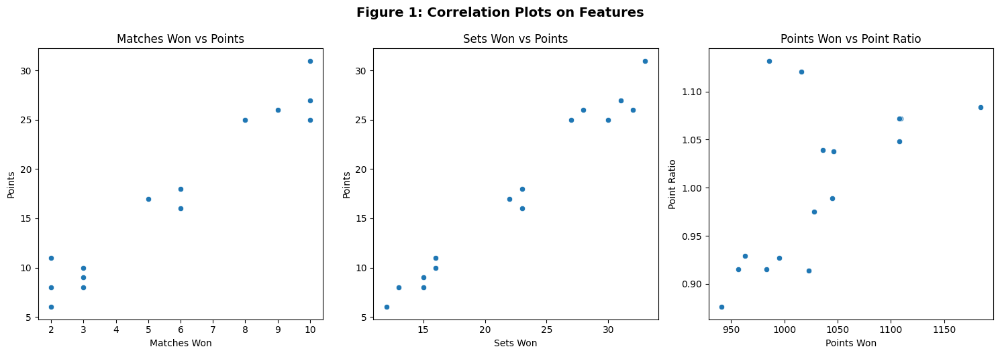

In [10]:
# Create subplots with one row and three columns
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Scatter plot for Matches Won vs Points
sns.scatterplot(x='Matches_Won', y='Points', data=df_standings, ax=axes[0])
axes[0].set_title('Matches Won vs Points')
axes[0].set_xlabel('Matches Won')
axes[0].set_ylabel('Points')

# Scatter plot for Sets Won vs Points
sns.scatterplot(x='Sets_Won', y='Points', data=df_standings, ax=axes[1])
axes[1].set_title('Sets Won vs Points')
axes[1].set_xlabel('Sets Won')
axes[1].set_ylabel('Points')

# Scatter plot for Points Won vs Point Ratio
sns.scatterplot(x='Points_Won', y='Point_Ratio', data=df_standings, ax=axes[2])
axes[2].set_title('Points Won vs Point Ratio')
axes[2].set_xlabel('Points Won')
axes[2].set_ylabel('Point Ratio')

# Adjust layout
plt.tight_layout()

# Add title to the entire diagram
plt.suptitle('Figure 1: Correlation Plots on Features', y=1.05, fontsize=14, fontweight='semibold')

# Show the plot
plt.show()



<div class="alert alert-success">
    
#### 💡 OBSERVATIONS and INSIGHTS
1. The top 5 teams based on points are strong contenders for winning future matches. 
2. There is a positive correlation between Matches Won and Points, indicating that teams that win more matches accumulate more points. 
3. Similarly, there is a strong positive relationship between Sets Won and Points. 
4. The Point Ratio is an important metric that correlates with the Points Won by the team. 
5. Outliers detected in various columns suggest varying team performances and potential areas for improvement.


</div>

---
<h2 style="color:#4d0077; text-align:left; text-transform: uppercase;">  2023 Volleyball Rosters (Men) </h2>

The dataset includes the roster of the 2023 Men's Volleyball team, featuring players from the top 16 teams. Each player is identified by a unique number, along with their name, position, player ID, country of origin, nationality, age, and height. Additional statistics include total points scored, average points per match, attack points, attack efficiency, block points, block success rate, serve points, serve success rate, and serve average points.

In [11]:
df_rosters = pd.read_csv("data/df_mens_rosters_21_23.csv")
df_rosters = df_rosters[df_rosters['Year'] == 2023]
df_rosters = df_rosters.drop(columns=['Year'])
df_display = df_rosters.head()
df_display = df_display.style.set_caption("<h4><b>Table 6.0: Volleyball 2023 Rosters (Men)</b></h4>")
df_display.set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center')]
}, {
    'selector': 'td',
    'props': [('text-align', 'center')]
}, {
    'selector': '',
    'props': [('margin-left', 'auto'), ('margin-right', 'auto')]
}])

,No.,Player Name,Position,Player_ID,Country_Name,Nationality,Age,Height,Total Points,Average by Match,Attack Points,Efficiency,Attack Avg Points,Block Points,Block Success,Block Avg Points,Serve Points,Serve Success,Serve Avg Points
701,1.000000,Sanchez Matias,S,142412.000000,Argentina,Argentina,27.000000,175.000000,1,0.08,0,0.00%,0.00,0,0.00%,0.00,1,1.61%,0.08
702,3.000000,Martinez Franchi Jan,U,142410.000000,Argentina,Argentina,26.000000,190.000000,28,2.15,25,38.46%,1.92,2,12.50%,0.15,1,2.86%,0.08
703,4.000000,Gallego Joaquin,MB,142411.000000,Argentina,Argentina,27.000000,204.000000,20,1.54,14,46.67%,1.08,6,19.35%,0.46,0,0.00%,0.00
704,7.000000,Palonsky Luciano,OH,162546.000000,Argentina,Argentina,24.000000,198.000000,183,14.08,151,49.35%,11.62,13,18.84%,1.00,19,9.31%,1.46
705,8.000000,Loser Agustin,MB,152692.000000,Argentina,Argentina,26.000000,198.000000,168,12.92,103,63.98%,7.92,53,32.52%,4.08,12,5.56%,0.92


In [12]:
df_rosters_desc = pd.DataFrame(df_rosters.describe(include='all').T)
df_rosters_desc = df_rosters_desc.style.set_caption("<h4><b>Table 6.1: Summary Statistics of Volleyball Rosters 2023 Dataset</b></h4>")
df_rosters_desc.set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center')]
}, {
    'selector': 'td',
    'props': [('text-align', 'center')]
}, {
    'selector': '',
    'props': [('margin-left', 'auto'), ('margin-right', 'auto')]
}])
df_rosters_desc

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
No.,224.000000,nan,nan,nan,13.941964,13.199444,1.000000,6.000000,12.000000,18.000000,99.000000
Player Name,240,240,Sanchez Matias,1,nan,nan,nan,nan,nan,nan,nan
Position,240,7,OH,74,nan,nan,nan,nan,nan,nan,nan
Player_ID,224.000000,nan,nan,nan,151379.616071,19832.302777,113691.000000,137261.750000,152387.500000,168268.250000,192453.000000
Country_Name,240,16,Argentina,15,nan,nan,nan,nan,nan,nan,nan
Nationality,224,16,Argentina,14,nan,nan,nan,nan,nan,nan,nan
Age,224.000000,nan,nan,nan,27.691964,4.354136,19.000000,25.000000,27.000000,30.000000,41.000000
Height,224.000000,nan,nan,nan,196.200893,15.602685,2.000000,192.000000,198.000000,203.250000,215.000000
Total Points,224,108,0,36,nan,nan,nan,nan,nan,nan,nan
Average by Match,224,151,0.00,30,nan,nan,nan,nan,nan,nan,nan


In [13]:
types = pd.DataFrame(df_rosters.dtypes)
types.columns = ['Type']
types = types.style.set_caption("<h4><b>Table 6.2: Volleyball Rosters 2023 Dataset - Data Types</b></h4>")
types.set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center'), ('min-width', '200px')]
}, {
    'selector': 'td',
    'props': [('text-align', 'center'), ('min-width', '200px')]
}, {
    'selector': '',
    'props': [('margin-left', 'auto'), ('margin-right', 'auto')]
}])
types

,Type
No.,float64
Player Name,object
Position,object
Player_ID,float64
Country_Name,object
Nationality,object
Age,float64
Height,float64
Total Points,object
Average by Match,object


Examination of **Table 6.1** and **Table 6.2** reveals several potential issues that may compromise the data's usability and accuracy:

<div class="alert alert-warning"> 
    
#### ⚠ POTENTIAL ISSUES

</div>

1. **Height Column**
    - An implausibly low minimum height of 2 cm suggests a significant data entry error. Such an outlier can severely skew the analysis, affecting the mean and standard deviation calculations. This error needs correcting either by replacing it with a plausible value or removing the erroneous entry.<br><br>

2. **Percentage Columns with Non-Numeric Characters**
    - Columns like `Efficiency`, `Block Success`, and `Serve Success` may have contained non-numeric characters (e.g., `-`, or `%` signs). These entries would prevent proper statistical calculations and analysis. Converting these values from strings to numeric values (e.g., converting '45%' to 0.45) and handling `-` by either replacing it with zeros or NaNs, depending on whether `-` denotes zero effectiveness or missing data, is crucial.<br><br>

3. **Columns with Only Non-Numeric Data**
    - Columns like `Player Name`, `Position`, `Country_Name`, and `Nationality` are purely categorical and do not have meaningful numeric summary statistics such as mean, std, min, etc. Including these in a numeric summary table suggests a misunderstanding of the data types involved or a misconfiguration in the data processing pipeline.<br><br>

4. **Inconsistent Data Types**
    - `Player_ID` might have been mistakenly treated as a numeric field due to its numeric appearance. However, as an identifier, it should be treated categorically to prevent any statistical operations that don't make sense for IDs. Converting `Player_ID` to a string ensures that it is appropriately used for identification and not for calculations.<br><br>

5. **Handling Missing Data**
    - Potential missing data or placeholders in various performance metric columns like `Total Points`, `Attack Points`, etc. If `0` or `-` were placeholders for missing or unrecorded data, their handling needs clarification and correct processing to ensure accurate analysis. Decisions on how to treat zeros and placeholders affect the reliability of statistical measures.


---

To correct the data, below imputation and transformation process was performed:

1. **Converting to Float**

    For several columns identified as primarily containing numerical data, the data types were converted to floats:

    - ***Columns Affected***: `No.`, `Age`, `Height`, `Total Points`, `Average by Match`, `Attack Points`, `Attack Avg Points`, `Block Points`, `Block Avg Points`, `Serve Points`, `Serve Avg Points`.
    - ***Method Used***: `pd.to_numeric()` - This function attempts to convert values to a floating point number. If the conversion fails (e.g., because the data includes non-numeric characters or symbols), those values are replaced with `NaN` (a floating point representation of "Not a Number"), ensuring all data in these columns is numeric.<br><br>

2. **Converting Player_ID to Object (String)**

    - ***Column Affected***: `Player_ID`.
    - ***Method Used***: `astype(str)`, which converts the column to a string data type.<br><br>

3. **Removing `%` and Converting to Float for Specific Columns**

    - ***Columns Affected***: `Efficiency`, `Block Success`, `Serve Success`.
    - ***Steps***:
      - *Replacing `-` with `0`*: Initial replacement of `-` with `0` addresses missing or undefined percentages, standardizing these entries to represent 0% effectiveness.
      - *Stripping `%` and Converting*: The percentage sign is removed using `str.rstrip(`%`)`, and then the result is converted to a float. Finally, it is divided by 100 to convert the percentage to a decimal form.

In [14]:
# Converting to float
columns_to_float = [
    'No.', 'Age', 'Height', 'Total Points', 'Average by Match', 'Attack Points', 
    'Attack Avg Points', 'Block Points', 'Block Avg Points', 'Serve Points', 'Serve Avg Points'
]

for col in columns_to_float:
    df_rosters[col] = pd.to_numeric(df_rosters[col], errors='coerce')

# Converting Player_ID to object (string)
df_rosters['Player_ID'] = df_rosters['Player_ID'].astype(str)

# Removing '%' and converting to float for specific columns
percentage_columns = ['Efficiency', 'Block Success', 'Serve Success']
for col in percentage_columns:
    df_rosters[col] = df_rosters[col].replace('-', '0')  # Replace '-' with '0'
    df_rosters[col] = df_rosters[col].str.rstrip('%').astype(float) / 100

In [15]:
types = pd.DataFrame(df_rosters.dtypes)
types.columns = ['Type']
types = types.style.set_caption("<h4><b>Table 6.3: Volleyball Rosters 2023 Dataset - Fixed Data Types</b></h4>")
types.set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center'), ('min-width', '200px')]
}, {
    'selector': 'td',
    'props': [('text-align', 'center'), ('min-width', '200px')]
}, {
    'selector': '',
    'props': [('margin-left', 'auto'), ('margin-right', 'auto')]
}])
types

,Type
No.,float64
Player Name,object
Position,object
Player_ID,object
Country_Name,object
Nationality,object
Age,float64
Height,float64
Total Points,float64
Average by Match,float64


In [16]:
df_rosters_desc = pd.DataFrame(df_rosters.describe().T)
df_rosters_desc = df_rosters_desc.style.set_caption("<h4><b>Table 6.4: Fixed Summary Statistics of Volleyball Rosters 2023 Dataset</b></h4>")
df_rosters_desc.set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center')]
}, {
    'selector': 'td',
    'props': [('text-align', 'center')]
}, {
    'selector': '',
    'props': [('margin-left', 'auto'), ('margin-right', 'auto')]
}])
df_rosters_desc

,count,mean,std,min,25%,50%,75%,max
No.,224.000000,13.941964,13.199444,1.000000,6.000000,12.000000,18.000000,99.000000
Age,224.000000,27.691964,4.354136,19.000000,25.000000,27.000000,30.000000,41.000000
Height,224.000000,196.200893,15.602685,2.000000,192.000000,198.000000,203.250000,215.000000
Total Points,224.000000,52.232143,56.867241,0.000000,4.000000,32.000000,83.250000,275.000000
Average by Match,218.000000,4.572661,4.557252,0.000000,0.470000,3.250000,7.377500,18.330000
Attack Points,224.000000,41.526786,48.052001,0.000000,1.750000,27.500000,62.500000,237.000000
Efficiency,224.000000,0.394931,0.240784,0.000000,0.310375,0.462100,0.538150,1.000000
Attack Avg Points,184.000000,4.317011,3.857338,0.000000,1.000000,3.495000,6.912500,15.800000
Block Points,224.000000,6.750000,7.689023,0.000000,0.750000,4.500000,10.000000,53.000000
Block Success,224.000000,0.150364,0.135327,0.000000,0.012900,0.150000,0.217400,1.000000


**Table 6.3** and **Table 6.4** shows the fixed summary statistics and provides a comprehensive view of various metrics concerning volleyball players. 

In [17]:
null_counts = pd.DataFrame(df_rosters.isnull().sum())
null_counts.columns = ['Count']
null_counts = null_counts.style.set_caption("<h4><b>Table 6.5: Volleyball Rosters 2023 Dataset - Null Values Counts</b></h4>")
null_counts.set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center'), ('min-width', '200px')]
}, {
    'selector': 'td',
    'props': [('text-align', 'center'), ('min-width', '200px')]
}, {
    'selector': '',
    'props': [('margin-left', 'auto'), ('margin-right', 'auto')]
}])
null_counts

,Count
No.,16
Player Name,0
Position,0
Player_ID,0
Country_Name,0
Nationality,16
Age,16
Height,16
Total Points,16
Average by Match,22


In [18]:
df_rosters_null_desc = df_rosters[df_rosters['No.'].isnull()]
#df_rosters[df_rosters['No.'].isnull()]
df_rosters_null_desc = df_rosters_null_desc.style.set_caption("<h4><b>Table 6.6: Volleyball Rosters 2023 Dataset - Null Data</b></h4>")
df_rosters_null_desc.set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center')]
}, {
    'selector': 'td',
    'props': [('text-align', 'center')]
}, {
    'selector': '',
    'props': [('margin-left', 'auto'), ('margin-right', 'auto')]
}])
df_rosters_null_desc

,No.,Player Name,Position,Player_ID,Country_Name,Nationality,Age,Height,Total Points,Average by Match,Attack Points,Efficiency,Attack Avg Points,Block Points,Block Success,Block Avg Points,Serve Points,Serve Success,Serve Avg Points
715,nan,Marcelo Rodolfo Mendez,COACH,nan,Argentina,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
730,nan,Renan Dal Zotto,COACH,nan,Brazil,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
745,nan,Plamen Konstantinov,COACH,nan,Bulgaria,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
760,nan,Tuomas Sammelvuo,COACH,nan,Canada,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
775,nan,Sheng Wu,COACH,nan,China,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
790,nan,Nicolas Ernesto Vives Coffigny,COACH,nan,Cuba,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
805,nan,Andrea Giani,COACH,nan,France,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
820,nan,Michał Winiarski,COACH,nan,Germany,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
835,nan,Behrouz Ataei Nouri,COACH,nan,Iran,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
850,nan,Ferdinando De Giorgi,COACH,nan,Italy,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


It was noted that the Volleybal Rosters dataset has entries for "COACH" with values of `nan`. So these entries were dropped. 

In [19]:
df_rosters = df_rosters[df_rosters['Position'] != 'COACH']

Data imputation was also made by filling `na` with 0 for missing averages.

In [20]:
df_rosters.fillna(0, inplace=True)

#### TEAM PROFILES

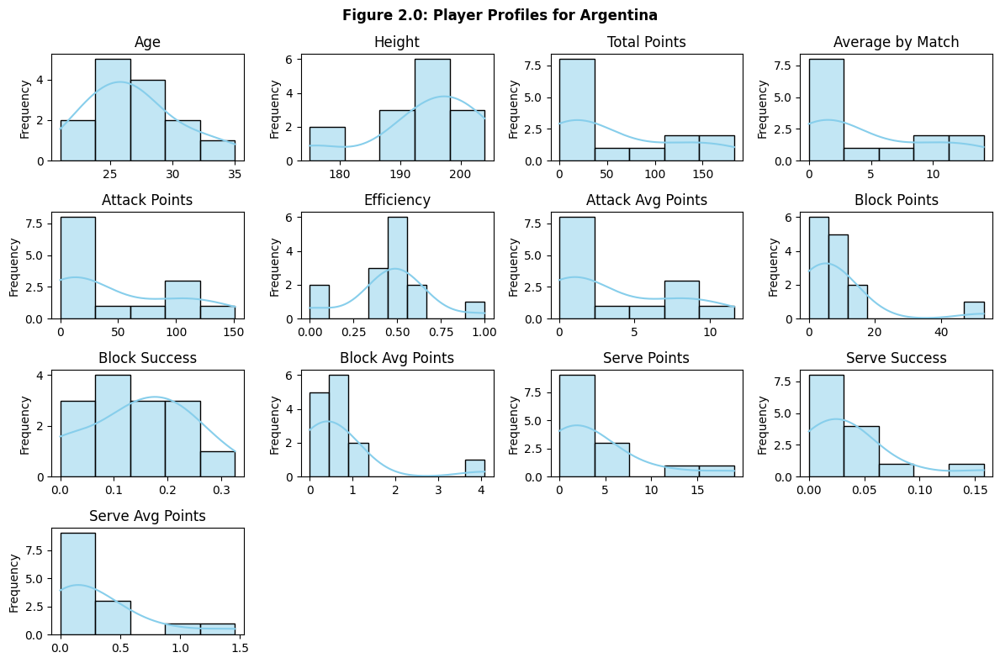

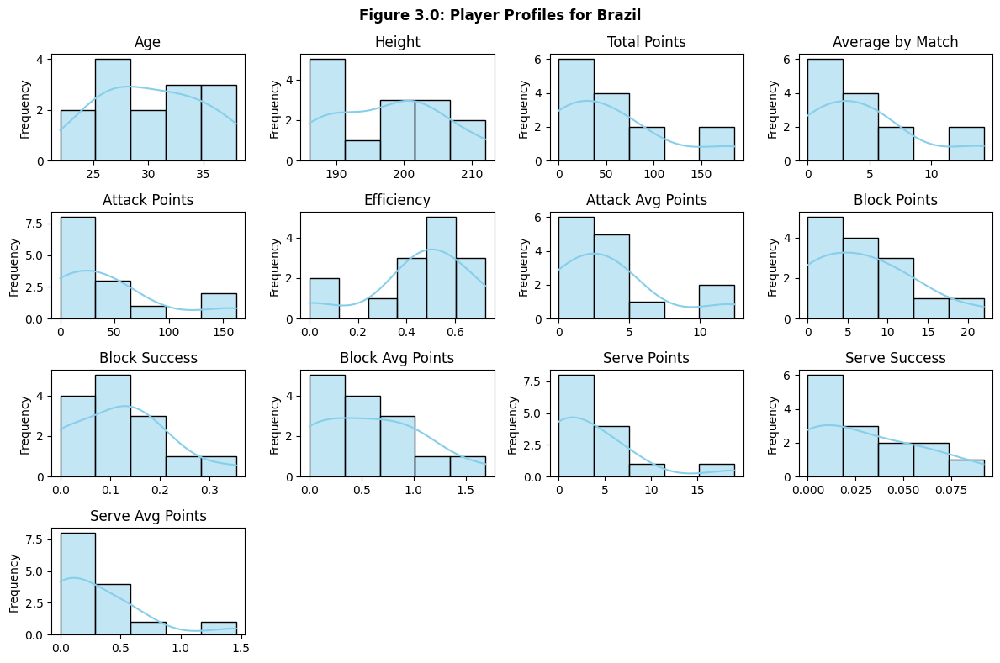

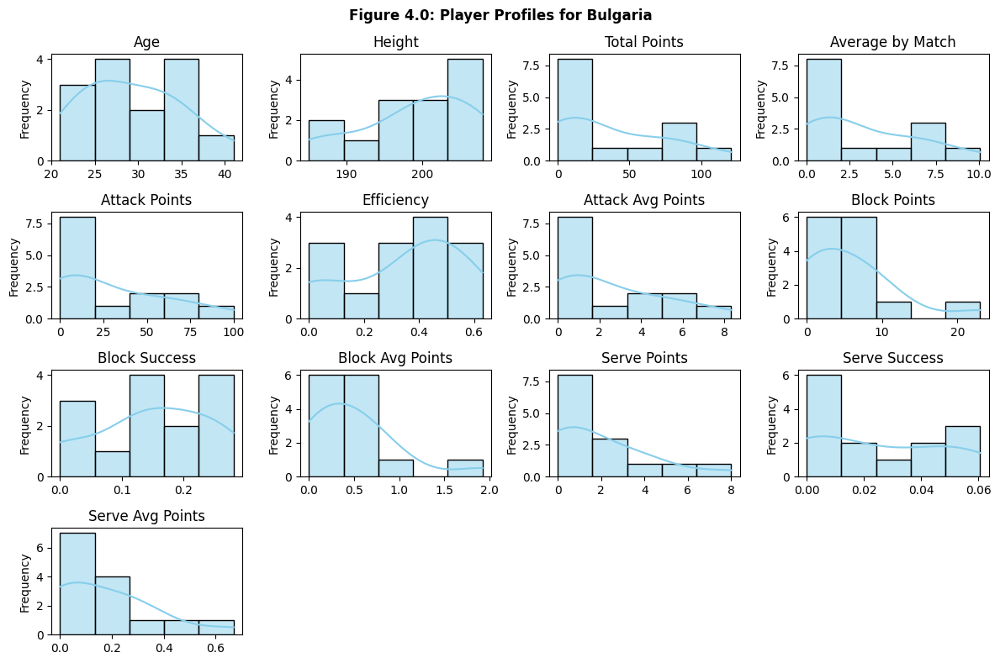

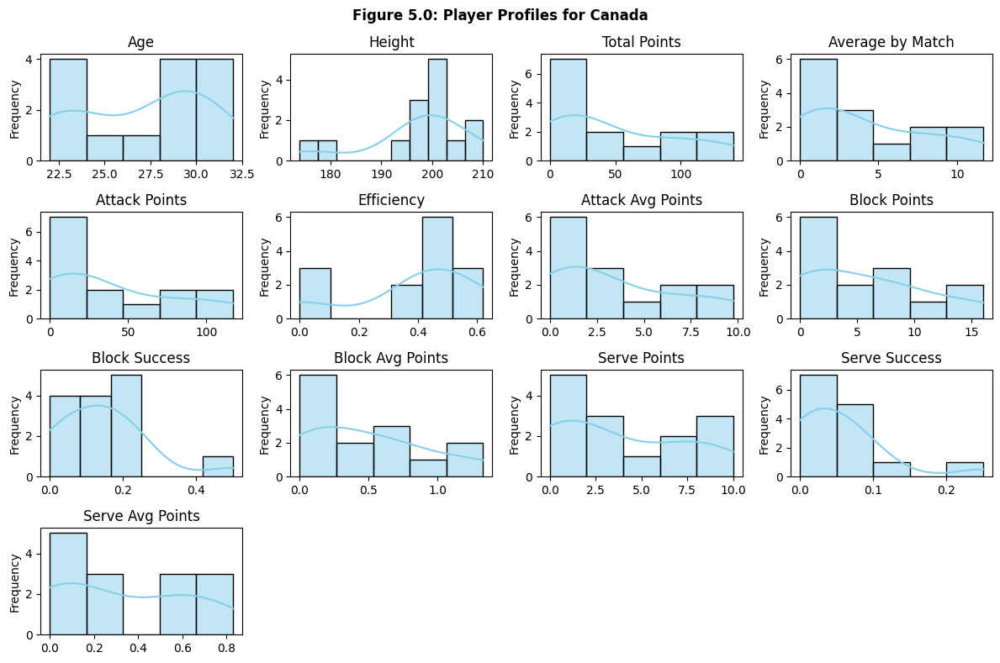

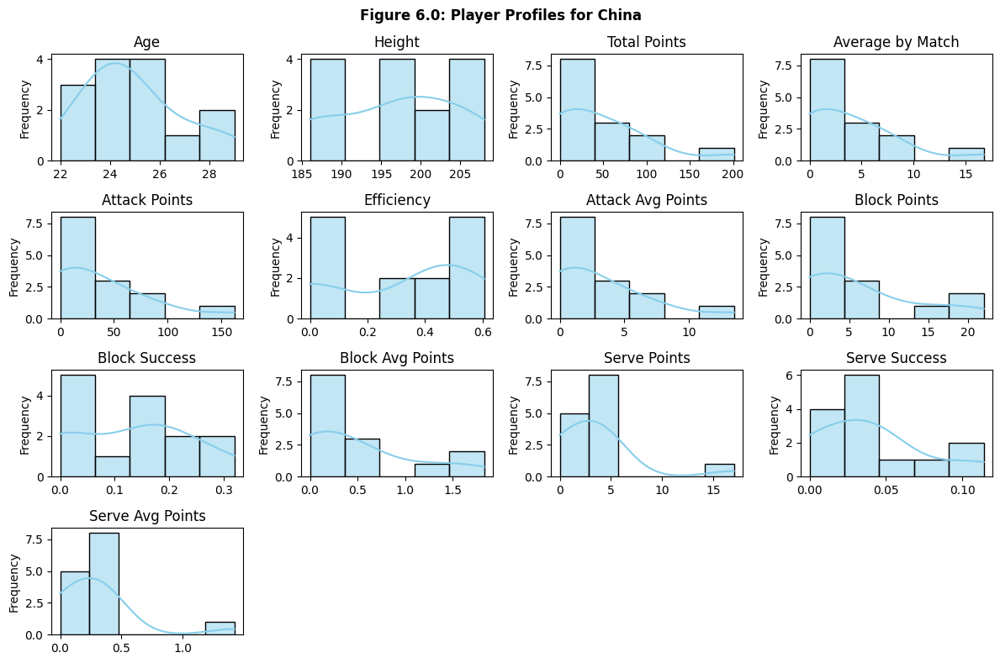

...

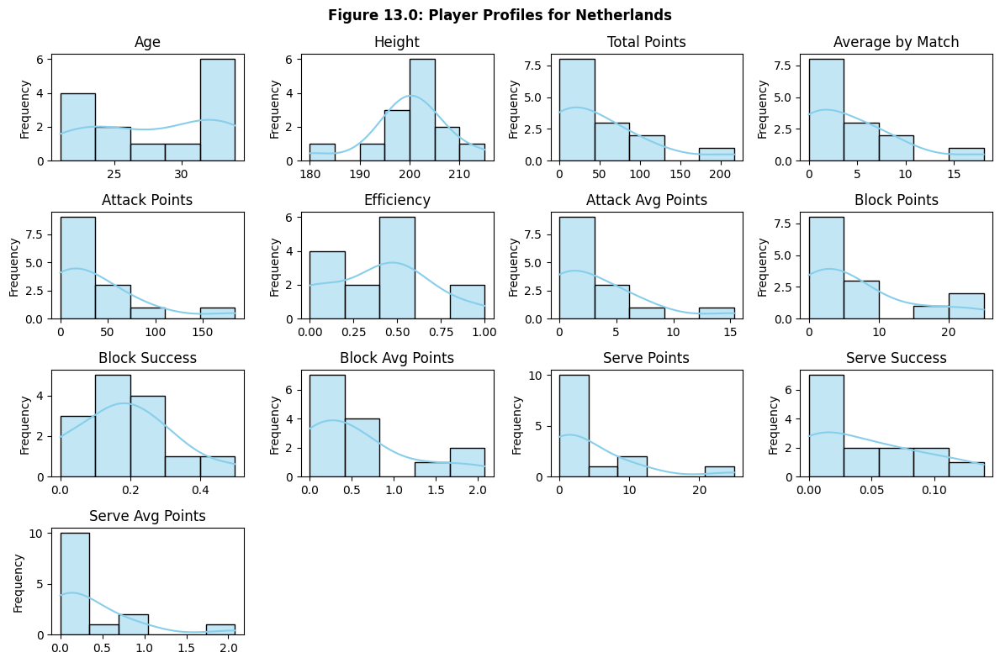

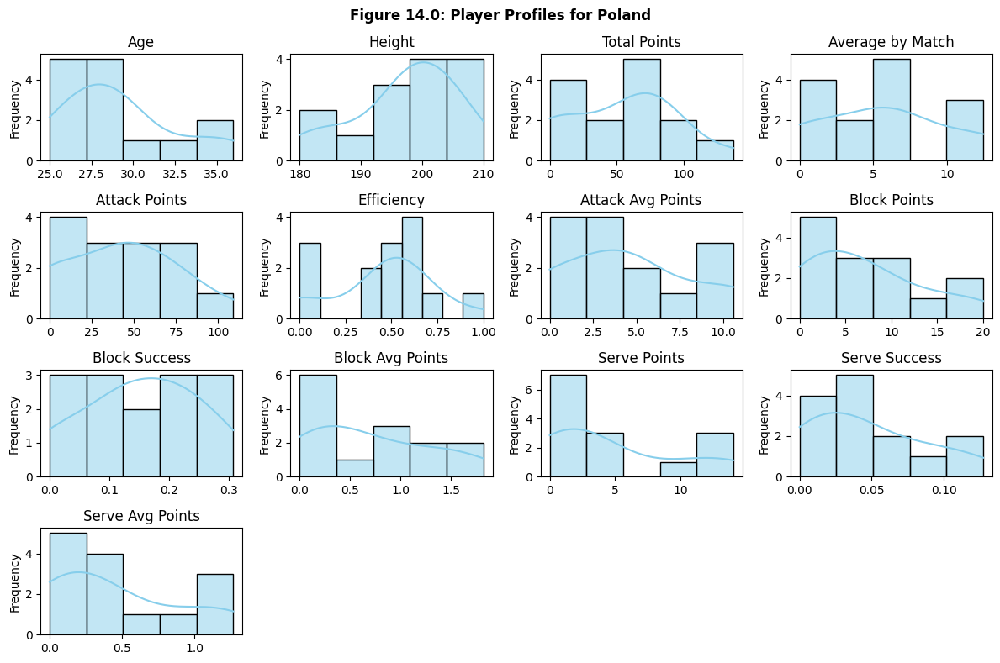

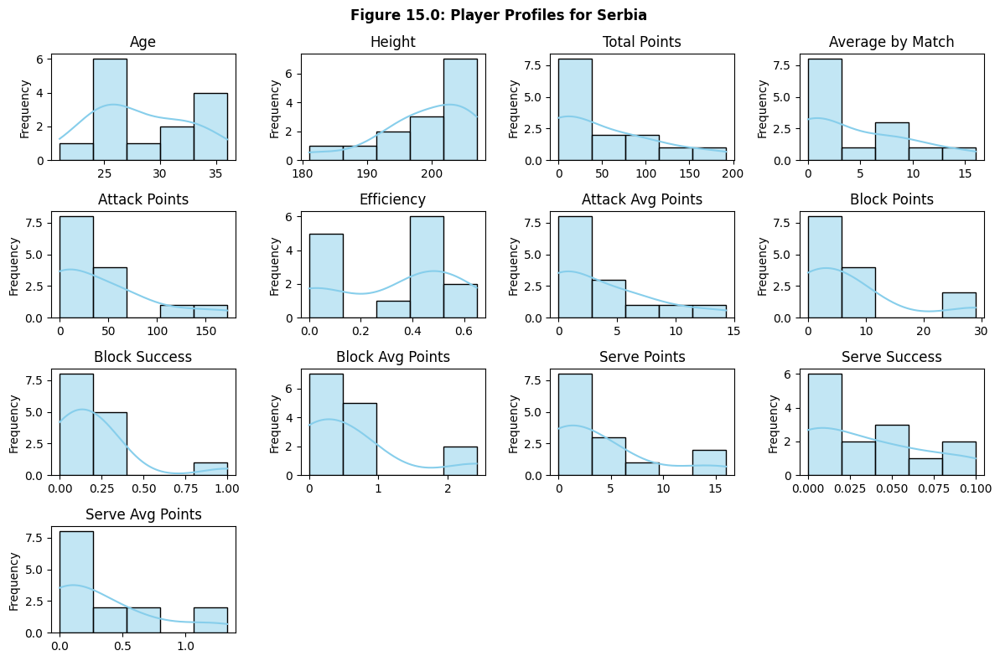

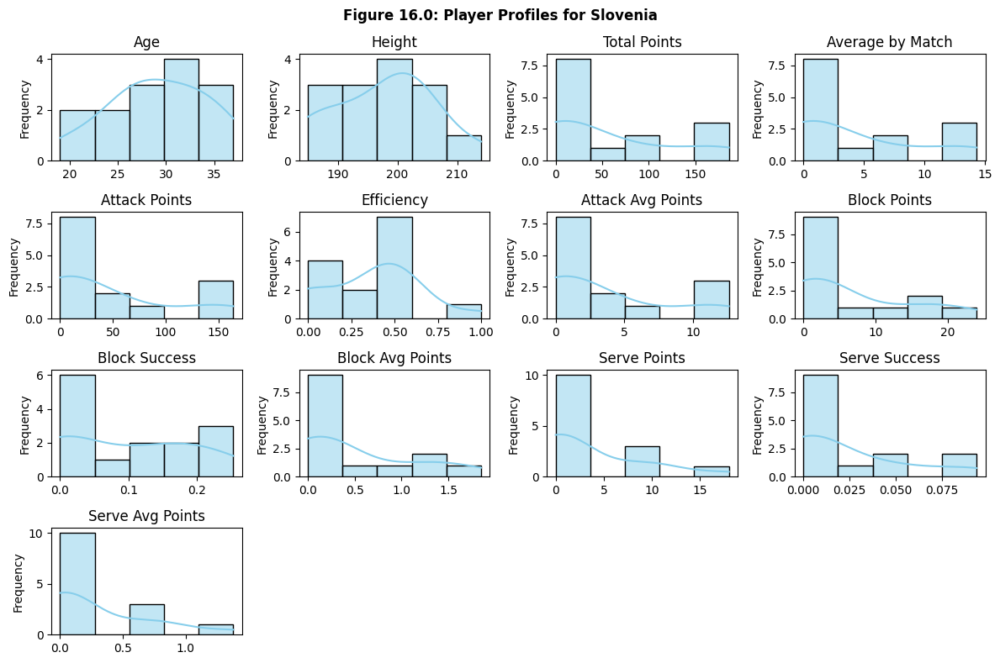

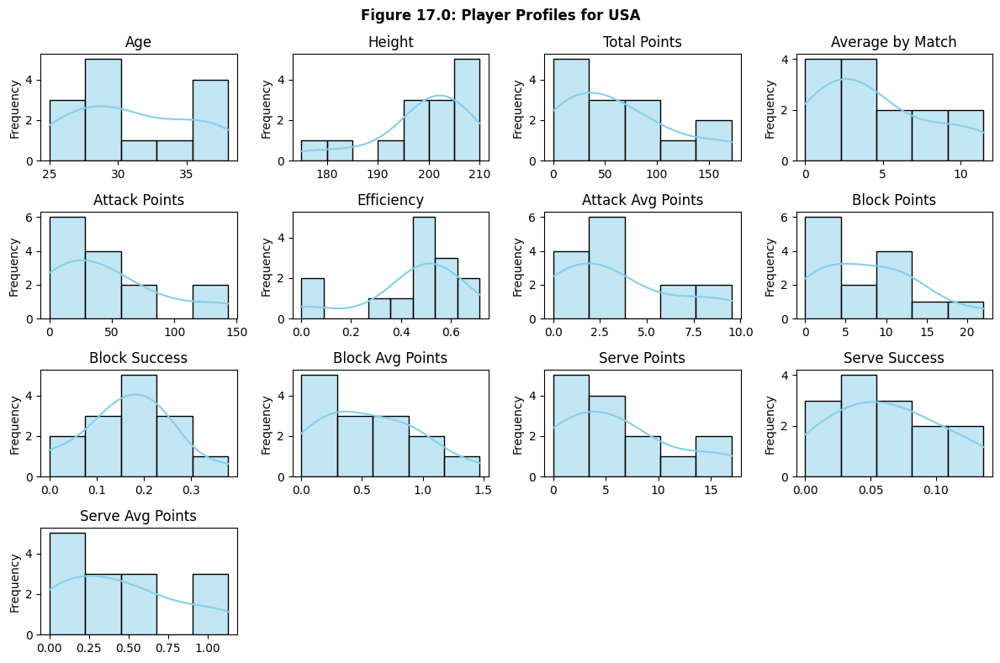

In [21]:
df_filtered = df_rosters.drop(columns=[
    'No.', 'Player Name', 'Player_ID', 'Nationality'
])

# Iterate over each country and plot histograms for numerical columns
countries = df_filtered['Country_Name'].unique()
for index, country in enumerate(countries):
    # Filter dataframe for the current country
    df_country = df_filtered[df_filtered['Country_Name'] == country]
    
    # Select numerical columns
    numerical_columns = df_country.select_dtypes(include=['float64', 'int64']).columns
    
    # Initialize figure
    plt.figure(figsize=(12, 8))
    
    # Plot histograms for each numerical column
    for i, col in enumerate(numerical_columns):
        plt.subplot(4, 4, i + 1)
        sns.histplot(df_country[col], kde=True, color='skyblue')
        plt.title(col)
        plt.xlabel('')
        plt.ylabel('Frequency')
    
    # Adjust index by adding 1 (for human-readable figure numbering)
    figure_number = index + 2.0
    
    # Set the suptitle with dynamic figure number and country name
    plt.suptitle(f'Figure {figure_number}: Player Profiles for {country}', fontsize=12, fontweight='semibold')
    
    # Save and show the figure
    plt.tight_layout()
    plt.show()

### Insights on the histograms of player profiles

**Argentina**
- **Age Distribution**: Concentration in the mid-20s to early 30s.
- **Height**: Mostly around 190 to 200 cm.
- **Efficiency**: Majority of players have moderate efficiency around 0.5.
- **Serve Success**: Relatively low serve success rates, suggesting room for improvement.

**Brazil**
- **Age Distribution**: Wide range from early 20s to early 30s.
- **Height**: Common heights around 190 to 210 cm.
- **Block Success**: Good distribution, peaking at around 0.1 and 0.2.
- **Serve Success**: Low, similar to other teams, indicating a possible area for enhancement.

**Bulgaria**
- **Age**: Players mostly in their late 20s.
- **Height**: Diverse heights with peaks around 200 cm.
- **Efficiency**: Peaks around 0.2 to 0.4, indicating variability in player performance.
- **Block Average Points**: Generally low, suggesting blocking is not a strong suit.

**Canada**
- **Height**: Peaks at higher ranges, indicating taller players.
- **Efficiency**: Most players have moderate to high efficiency, with a peak at around 0.4.
- **Serve Success**: Very low success rates, which could be a focus for training.

**China**
- **Age**: Younger players, mostly in their mid-20s.
- **Height**: Peaks around 195 to 200 cm.
- **Average by Match**: Lower average points per match.
- **Serve Success**: Very low, with most players having a serve success rate below 0.05.

**Cuba**
- **Height**: Noticeable peak at 200 cm, but some data inaccuracies or outliers under 100 cm likely due to data entry errors.
- **Efficiency and Serve Success**: Both metrics show low performance, indicating potential areas for improvement.

**France**
- **Age**: Mostly concentrated in the late 20s.
- **Height**: Good distribution around 190 to 200 cm.
- **Serve Success**: Quite low, similar to other teams, suggesting serving skills may need enhancement.

**Germany**
- **Age**: Wider age range with peaks in the late 20s.
- **Efficiency**: More consistent around 0.2 to 0.4, indicating effective performance in certain aspects.
- **Serve Success**: Relatively low, a common trend across the teams.

**Iran**
- **Age and Height**: Broad age range and a peak in height around 200 cm.
- **Efficiency**: Peaks at around 0.4, indicating strong aspects of play.
- **Serve Average Points**: Generally low, suggesting serving is a less effective skill for these players.

**Italy**
- **Age Distribution**: Most players are in their mid to late 20s.
- **Height**: Concentration around 190 to 200 cm, typical for volleyball players.
- **Efficiency**: Peaks at around 0.4, suggesting good overall performance.
- **Serve Success**: Most values are low, indicating serving is not the strongest aspect for the team.

**Japan**
- **Height**: Lower heights compared to other teams, with peaks below 190 cm.
- **Efficiency**: Wide distribution with a peak at 0.2, suggesting variability in player effectiveness.
- **Serve Success**: Most players have low serve success rates, peaking around 0.05.

**Netherlands**
- **Height**: Well-distributed with a focus around 200 cm.
- **Average by Match**: Players generally score lower points per match.
- **Efficiency and Serve Success**: Both metrics show players are generally less efficient in their serves.

**Poland**
- **Age**: Mostly concentrated around late 20s to early 30s.
- **Efficiency**: More consistent, with a peak around 0.5, indicating strong player performance.
- **Serve Success**: Very low rates, suggesting serving may be a weaker skill for this team.

**Serbia**
- **Height and Age**: Wider range in age and height, suggesting a diverse team.
- **Block Success**: Peaks around 0.25, showing a significant contribution in blocking.
- **Serve Success**: Generally low, indicating potential area for improvement.

**Slovenia**
- **Height**: Taller players peaking around 200 cm.
- **Block Avg Points**: Lower block points, indicating fewer blocks made successfully.
- **Serve Avg Points**: Low serving points suggest serving as a less effective skill among players.

**USA**
- **Age Distribution**: Wider age range with players from early 20s to mid-30s.
- **Efficiency**: Peaks at 0.4 and 0.6, indicating high performance in certain aspects.
- **Serve Success**: Generally low serve success rates.

---
### CREATING TEAM PROFILES

Creating team profiles based on team statistics is essential because they will be aggregated with the match data to train the model. By integrating team-level statistics with match outcomes, the model gains valuable context about team compositions and performance characteristics for each match. 


1. **Drop Irrelevant Columns** - Initially, the code removes columns that are not required for the team profile, such as player identifiers and names.

2. **Group by Country** - The data is then grouped by `Country_Name`, which helps in analyzing each country`s team separately.

3. **Count Positions** - For each country, the code calculates the count of players in each position (e.g., OH, MB, S) to understand the distribution of player roles within the team.

4. **Aggregate Numerical Data** -  The code computes summary statistics for numerical attributes such as age, height, and performance metrics like total points, average by match, etc. It calculates both the mean and standard deviation of these numerical attributes for each country`s team.

5. **Concatenate Results** - Finally, the position counts and numerical statistics are combined into a single DataFrame called df_team_profile.

In [22]:
# Drop irrelevant columns
df_filtered = df_rosters.drop(columns=[
    'No.', 'Player Name', 'Player_ID', 'Nationality'
])

# Group by 'Country_Name'
grouped = df_filtered.groupby('Country_Name')

# Aggregate numerical data by mean and standard deviation
numerical_stats = grouped.mean().add_prefix('Mean_Player_').join(grouped.std().add_prefix('Std_Player_'))
df_team_profile = numerical_stats.copy()


# Reset index
df_team_profile.reset_index(inplace=True)

# Replace country names with country codes
df_team_profile['Country_Name']= df_team_profile['Country_Name'].replace(country_codes_2023)

df_display = df_team_profile
df_display = df_display.style.set_caption("<h4><b>Table 7.0: Volleyball 2023 Team Country Profiles</b></h4>")
df_display.set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center')]
}, {
    'selector': 'td',
    'props': [('text-align', 'center')]
}, {
    'selector': '',
    'props': [('margin-left', 'auto'), ('margin-right', 'auto')]
}])

,Country_Name,Mean_Player_Age,Mean_Player_Height,Mean_Player_Total Points,Mean_Player_Average by Match,Mean_Player_Attack Points,Mean_Player_Efficiency,Mean_Player_Attack Avg Points,Mean_Player_Block Points,Mean_Player_Block Success,Mean_Player_Block Avg Points,Mean_Player_Serve Points,Mean_Player_Serve Success,Mean_Player_Serve Avg Points,Std_Player_Age,Std_Player_Height,Std_Player_Total Points,Std_Player_Average by Match,Std_Player_Attack Points,Std_Player_Efficiency,Std_Player_Attack Avg Points,Std_Player_Block Points,Std_Player_Block Success,Std_Player_Block Avg Points,Std_Player_Serve Points,Std_Player_Serve Success,Std_Player_Serve Avg Points
0,ARG,26.857143,193.928571,61.785714,4.792143,48.642857,0.458286,3.759286,8.928571,0.148236,0.699286,4.214286,0.038557,0.333571,3.799942,9.008238,66.079414,5.055095,52.947880,0.246710,4.059089,13.538914,0.100561,1.039256,5.451585,0.043315,0.419571
1,BRA,30.214286,197.714286,56.785714,4.707143,45.928571,0.445479,3.822143,7.142857,0.120350,0.585714,3.714286,0.029679,0.300714,4.806703,8.128095,61.058835,4.566132,53.136203,0.215811,3.967986,6.619983,0.102686,0.521207,5.209881,0.030123,0.405415
2,BUL,29.357143,199.142857,37.714286,3.270714,29.785714,0.338650,2.580714,5.928571,0.147214,0.512857,2.000000,0.024464,0.178571,5.772710,7.471558,39.043228,3.170104,32.503677,0.219640,2.649640,6.366551,0.096838,0.518955,2.385856,0.023804,0.199417
3,CAN,27.000000,197.000000,50.357143,4.286429,40.785714,0.375207,3.461429,5.785714,0.147586,0.490714,3.785714,0.055557,0.332857,3.551814,10.122329,49.156903,4.057767,42.080835,0.217634,3.482806,5.465677,0.131823,0.448853,3.683196,0.066522,0.307882
4,CHN,24.928571,196.928571,47.928571,3.997857,38.214286,0.306050,3.184286,6.142857,0.127479,0.512143,3.571429,0.039043,0.300000,1.979288,7.946594,57.026936,4.750299,47.743189,0.245245,3.978397,7.326004,0.111992,0.610009,4.327271,0.036680,0.359936
5,CUB,25.571429,180.857143,52.714286,4.394286,41.928571,0.325936,3.492857,7.142857,0.201921,0.596429,3.642857,0.025886,0.302857,3.030976,51.942064,68.499779,5.708056,58.827602,0.246434,4.901916,8.008238,0.248412,0.668519,6.511613,0.034204,0.542280
6,FRA,29.500000,196.714286,50.214286,5.340000,41.285714,0.447579,4.375714,5.571429,0.156043,0.630000,3.357143,0.039550,0.335000,2.875627,7.579614,36.008927,3.798099,32.544475,0.216787,3.435549,4.219265,0.098200,0.524126,2.648865,0.029425,0.247814
7,GER,27.285714,198.000000,46.357143,4.250000,37.428571,0.467079,3.476429,5.428571,0.163943,0.463571,3.500000,0.039550,0.310000,4.598136,8.691287,46.521471,3.913965,40.718006,0.222380,3.516057,4.432646,0.090596,0.362419,4.127767,0.035867,0.337434
8,IRI,25.642857,198.357143,33.714286,3.386429,25.857143,0.373057,2.682143,5.928571,0.127957,0.536429,1.928571,0.019743,0.167857,4.955295,9.596531,35.519071,3.499364,27.188394,0.224091,2.911955,10.087801,0.119090,0.839603,2.525692,0.024903,0.218075
9,ITA,24.714286,197.928571,61.857143,5.145000,46.857143,0.394893,3.856429,9.285714,0.183379,0.811429,5.714286,0.049836,0.476429,1.898525,8.721894,66.824520,5.197678,54.576491,0.239488,4.173264,9.084463,0.135678,0.814625,6.603362,0.047654,0.512244


---
<h2 style="color:#4d0077; text-align:left; text-transform: uppercase;">  Volleyball Match Data (Men) </h2>

This dataset contains match data for the Volleyball 2023 season. Each row corresponds to a match and includes information about the two competing teams (`Team1` and `Team2`), their respective performance rankings (`Team1_Performance_Ranking` and `Team2_Performance_Ranking`), and the match result (`Results`). The match result is represented as the number of sets won by each team separated by a hyphen. For example, `2 - 3` indicates that Team1 won 2 sets, and Team2 won 3 sets.

In [23]:
df_matches = pd.read_csv('data/vnl_matches_2023.csv')

# Only include matches from the current roster
df_matches = df_matches[(df_matches['Team1'].isin(country_codes_2023.values())) & (df_matches['Team2'].isin(country_codes_2023.values()))]
df_matches.rename(columns={'Team1_Points': 'Team1_Performance_Ranking', 'Team2_Points': 'Team2_Performance_Ranking'}, inplace=True)

df_display = df_matches.head()
df_display = df_display.style.set_caption("<h4><b>Table 8.0: Volleyball 2023 Matches</b></h4>")
df_display.set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center'), ('min-width', '100px')]
}, {
    'selector': 'td',
    'props': [('text-align', 'center'), ('min-width', '100px')]
}, {
    'selector': '',
    'props': [('margin-left', 'auto'), ('margin-right', 'auto')]
}])

,Team1,Team1_Performance_Ranking,Team2,Team2_Performance_Ranking,Results
0,CHN,125.670000,POL,421.130000,2 - 3
1,POL,421.120000,NED,219.210000,3 - 1
2,POL,419.360000,ARG,311.490000,3 - 1
4,POL,418.900000,CAN,216.250000,3 - 2
5,POL,418.430000,BUL,141.060000,3 - 0


In [24]:
# df_matches['Results'].value_counts()

#### Match Results Distribution:
- `3-0 (90 matches)`: This is the most common result, indicating matches that were one-sided where one team dominated the other without losing a set. A high frequency of this result can suggest a disparity in team strengths in many matches.
- `0-3 (56 matches)`: Similar to the 3-0 outcome but in favor of the opposing team, indicating the team in question lost without winning a set in these instances.
- `1-3 (50 matches)`: This result indicates that while the losing teams were able to win a set, they still lost the majority of the sets played. This suggests some competitiveness, but with a clear stronger side in most of these matches.
- `3-1 (50 matches)`: Reflects matches where the winning team was largely dominant but dropped a set. This scoreline indicates competitive matches where the losing team managed to put up a significant challenge in at least one set.
- `3-2 (42 matches)`: These matches were the most closely contested, with the winning team securing victory in the final set. This result suggests very balanced and competitive matches, likely involving teams of similar strength.
- `2-3 (34 matches)`: The least frequent result, indicating close matches where the team in question came close to winning but ultimately lost in the final set. Like the 3-2 results, these matches show high competitiveness and tension.

<div class="alert alert-success">
    
#### 💡 INSIGHTS:
- The frequency of straight-set matches (3-0 and 0-3) is notable and suggests that many matches were not closely contested, possibly pointing to mismatches in team strengths or outstanding performances by some teams.
- The relatively balanced number of 3-1 and 1-3 outcomes next to the straight-set results indicates a moderate level of competitiveness across the tournament. Teams could often challenge their opponents but not consistently enough to affect the outcome significantly.
- The close set matches (3-2 and 2-3), although less frequent than the straight-set matches, are critical for understanding the competitive balance in the league. These results indicate thrilling matches where the outcome was uncertain until the final moments.

  
</div>

<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;"> Machine Learning </h1>

This section involves preparing the dataset by aggregating match data and team profiles, followed by training and validating predictive models. Irrelevant columns are dropped, and team profiles are created by calculating player counts and summary statistics for each team. Models are then trained using various classification algorithms, and hyperparameters are optimized through grid search with cross-validation. The best-performing model is selected and evaluated using precision, recall, and accuracy metrics. To understand the model's predictions, SHAP is employed to provide insights into feature importance and decision-making processes, enhancing user confidence in the model's outcomes. 

---

<h2 style="color:#4d0077; text-align:left; text-transform: uppercase;"> Aggregating Data </h2>

To aggregate matches and create team profiles, the process begins by dropping irrelevant columns from the dataset, such as player identifiers and names. Next, the data is grouped by country, allowing for individual analysis of each team. Player positions (e.g., OH, MB, S) are dropped. Additionally, summary statistics are calculated for numerical attributes like age, height, and performance metrics such as total points and average by match. These statistics include both the mean and standard deviation for each country`s team. 


Initially, suffixes `Team1_` and `Team2_` are added to the columns of the team profile, creating separate data profiles for Team 1 and Team 2. The matches dataset is then merged with the team profile for each team. Columns Team1_Country_Name and Team2_Country_Name are subsequently dropped so that the model is team agnostic comparing only profile vs profile. Following this, column names beginning with `Team1_` and `Team2_` are selected and reordered for consistency. These columns, along with the `Results` column, are then aggregated to create the final  DataFrame.  

In [25]:
# Add suffixes to the columns of df_team_profile
df_team_profile_team1 = df_team_profile.add_prefix('Team1_')
df_team_profile_team2 = df_team_profile.add_prefix('Team2_')

# Merge df_matches with df_team_profile for Team 1
df_agg_matches = pd.merge(df_matches, df_team_profile_team1, left_on='Team1', right_on='Team1_Country_Name', how='left')

# Merge df_matches with df_team_profile for Team 2
df_agg_matches = pd.merge(df_agg_matches, df_team_profile_team2, left_on='Team2', right_on='Team2_Country_Name', how='left')

df_agg_matches.drop(columns=['Team1_Country_Name', 'Team2_Country_Name'], inplace=True)

In [26]:
# Get column names starting with 'Team1_'
team1_columns = [col for col in df_agg_matches.columns if col.startswith('Team1')]

# Get column names starting with 'Team2_'
team2_columns = [col for col in df_agg_matches.columns if col.startswith('Team2')]

# Reorder columns
new_columns_order = team1_columns + team2_columns + ['Results']
df_agg_matches = df_agg_matches[new_columns_order]

df_display = df_agg_matches[0:14]
df_display = df_display.style.set_caption("<h4><b>Table 9.0: Aggregated Matches</b></h4>")
df_display.set_table_styles([{
    'selector': 'th',
    'props': [('text-align', 'center'), ('min-width', '100px')]
}, {
    'selector': 'td',
    'props': [('text-align', 'center'), ('min-width', '100px')]
}, {
    'selector': '',
    'props': [('margin-left', 'auto'), ('margin-right', 'auto')]
}])

,Team1,Team1_Performance_Ranking,Team1_Mean_Player_Age,Team1_Mean_Player_Height,Team1_Mean_Player_Total Points,Team1_Mean_Player_Average by Match,Team1_Mean_Player_Attack Points,Team1_Mean_Player_Efficiency,Team1_Mean_Player_Attack Avg Points,Team1_Mean_Player_Block Points,Team1_Mean_Player_Block Success,Team1_Mean_Player_Block Avg Points,Team1_Mean_Player_Serve Points,Team1_Mean_Player_Serve Success,Team1_Mean_Player_Serve Avg Points,Team1_Std_Player_Age,Team1_Std_Player_Height,Team1_Std_Player_Total Points,Team1_Std_Player_Average by Match,Team1_Std_Player_Attack Points,Team1_Std_Player_Efficiency,Team1_Std_Player_Attack Avg Points,Team1_Std_Player_Block Points,Team1_Std_Player_Block Success,Team1_Std_Player_Block Avg Points,Team1_Std_Player_Serve Points,Team1_Std_Player_Serve Success,Team1_Std_Player_Serve Avg Points,Team2,Team2_Performance_Ranking,Team2_Mean_Player_Age,Team2_Mean_Player_Height,Team2_Mean_Player_Total Points,Team2_Mean_Player_Average by Match,Team2_Mean_Player_Attack Points,Team2_Mean_Player_Efficiency,Team2_Mean_Player_Attack Avg Points,Team2_Mean_Player_Block Points,Team2_Mean_Player_Block Success,Team2_Mean_Player_Block Avg Points,Team2_Mean_Player_Serve Points,Team2_Mean_Player_Serve Success,Team2_Mean_Player_Serve Avg Points,Team2_Std_Player_Age,Team2_Std_Player_Height,Team2_Std_Player_Total Points,Team2_Std_Player_Average by Match,Team2_Std_Player_Attack Points,Team2_Std_Player_Efficiency,Team2_Std_Player_Attack Avg Points,Team2_Std_Player_Block Points,Team2_Std_Player_Block Success,Team2_Std_Player_Block Avg Points,Team2_Std_Player_Serve Points,Team2_Std_Player_Serve Success,Team2_Std_Player_Serve Avg Points,Results
0,CHN,125.670000,24.928571,196.928571,47.928571,3.997857,38.214286,0.306050,3.184286,6.142857,0.127479,0.512143,3.571429,0.039043,0.300000,1.979288,7.946594,57.026936,4.750299,47.743189,0.245245,3.978397,7.326004,0.111992,0.610009,4.327271,0.036680,0.359936,POL,421.130000,29.214286,197.214286,54.071429,5.665000,42.214286,0.452821,4.495000,7.071429,0.153207,0.708571,4.785714,0.046579,0.462857,3.332326,8.505008,41.235654,4.467172,33.925662,0.283377,3.832225,6.330200,0.097175,0.605384,5.056277,0.041307,0.453388,2 - 3
1,POL,421.120000,29.214286,197.214286,54.071429,5.665000,42.214286,0.452821,4.495000,7.071429,0.153207,0.708571,4.785714,0.046579,0.462857,3.332326,8.505008,41.235654,4.467172,33.925662,0.283377,3.832225,6.330200,0.097175,0.605384,5.056277,0.041307,0.453388,NED,219.210000,28.071429,199.857143,50.857143,4.431429,39.428571,0.395614,3.455000,6.857143,0.188521,0.586429,4.571429,0.045986,0.388571,4.874806,7.979369,62.338847,5.206086,52.188584,0.310333,4.377790,7.882377,0.142103,0.651373,6.947211,0.046490,0.575057,3 - 1
2,POL,419.360000,29.214286,197.214286,54.071429,5.665000,42.214286,0.452821,4.495000,7.071429,0.153207,0.708571,4.785714,0.046579,0.462857,3.332326,8.505008,41.235654,4.467172,33.925662,0.283377,3.832225,6.330200,0.097175,0.605384,5.056277,0.041307,0.453388,ARG,311.490000,26.857143,193.928571,61.785714,4.792143,48.642857,0.458286,3.759286,8.928571,0.148236,0.699286,4.214286,0.038557,0.333571,3.799942,9.008238,66.079414,5.055095,52.947880,0.246710,4.059089,13.538914,0.100561,1.039256,5.451585,0.043315,0.419571,3 - 1
3,POL,418.900000,29.214286,197.214286,54.071429,5.665000,42.214286,0.452821,4.495000,7.071429,0.153207,0.708571,4.785714,0.046579,0.462857,3.332326,8.505008,41.235654,4.467172,33.925662,0.283377,3.832225,6.330200,0.097175,0.605384,5.056277,0.041307,0.453388,CAN,216.250000,27.000000,197.000000,50.357143,4.286429,40.785714,0.375207,3.461429,5.785714,0.147586,0.490714,3.785714,0.055557,0.332857,3.551814,10.122329,49.156903,4.057767,42.080835,0.217634,3.482806,5.465677,0.131823,0.448853,3.683196,0.066522,0.307882,3 - 2
4,POL,418.430000,29.214286,197.214286,54.071429,5.665000,42.214286,0.452821,4.495000,7.071429,0.153207,0.708571,4.785714,0.046579,0.462857,3.332326,8.505008,41.235654,4.467172,33.925662,0.283377,3.832225,6.330200,0.097175,0.605384,5.056277,0.04130

<h2 style="color:#4d0077; text-align:left; text-transform: uppercase;"> Model Training and Validation </h2>

For model training and validation, several classification algorithms were employed to predict match outcomes. The process involved splitting the data into training and validation sets using a test size of `20%`. Grid search was performed with cross-validation `(cv=10)` to determine the best hyperparameters for each classifier. The pipeline utilized classifiers like **DecisionTreeClassifier**, **RandomForestClassifier**, **GradientBoostingClassifier**, **KNeighborsClassifier**, and **SVC**. 

In [27]:
# Define the parameter grid
param_grid = [
    {
        'clf': [DecisionTreeClassifier()],
        'clf__max_depth': [2, 3, 4]
    },
    {
        'clf': [RandomForestClassifier()],
        'clf__max_depth': [2, 3, 4, 5],
        'clf__n_estimators': [10, 20, 50, 100, 150, 200]
    },
    {
        'clf': [GradientBoostingClassifier()],
        'clf__max_depth': [2, 3, 4, 5],
        'clf__n_estimators': [10, 20, 50, 100, 150, 200]
    },
    {
        'clf': [KNeighborsClassifier()],
        'clf__n_neighbors': [2, 3, 4, 5, 6, 7, 8, 9]
    },
    {
        'clf': [SVC()],
        'clf__kernel': ['rbf', 'sigmoid', 'poly'],
        'clf__C': [0.001, 0.05, 0.01, 0.5, 0.1, 1, 10]
    },
]

<h3 style="color:#fff; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;"> Grid Search (Win Outcome) </h3>

![Cover Image](data_pipeline_1.png)

The best-performing model, determined by grid search, was a `GradientBoostingClassifier` with specific hyperparameters `(max_depth=4, n_estimators=100)`. This model was trained on the entire training-validation dataset and evaluated on the test set. Precision, recall, F1 score, and accuracy scores were computed to assess the model's performance. 

In [28]:
df_win_loss = df_agg_matches.copy()

def convert_to_win_loss(result):
    team1_sets, team2_sets = map(int, result.split(' - '))
    return '1 - 0' if team1_sets > team2_sets else '0 - 1'

df_win_loss['Results_2'] = df_win_loss['Results'].apply(convert_to_win_loss)
df_win_loss.drop(columns=['Results'], inplace=True)

label_encoder_win_loss = LabelEncoder()
target = 'Results_2'

df_win_loss_encoded = df_win_loss.copy()
X_win_loss = df_win_loss_encoded.copy()
X_win_loss.drop(columns=['Team1', 'Team2', target], inplace=True)
y_win_loss = label_encoder_win_loss.fit_transform(df_win_loss_encoded[target])

# Get the label encoder dictionary
result_label_dict_win_loss = dict(zip(label_encoder_win_loss.transform(label_encoder_win_loss.classes_), label_encoder_win_loss.classes_))

X_train_win_loss, X_test_win_loss, y_train_win_loss, y_test_win_loss = train_test_split(X_win_loss, y_win_loss, test_size=0.2, random_state=42)

pipe_win_loss = Pipeline([
    ('scaler', RobustScaler()),
    ('clf', None)
])

grid_search_win_loss = GridSearchCV(
    estimator=pipe_win_loss,
    param_grid=param_grid,
    cv=10,
    scoring='accuracy',
    n_jobs=-1,
    return_train_score=True
)

# COMMENTED THIS OUT - Note that there will be some randomness on the estimators and max_depth
# grid_search_win_loss.fit(X_train_win_loss, y_train_win_loss)
# print(f"The best model is: {grid_search_win_loss.best_params_}")
# print(f"with an accuracy score of: {grid_search_win_loss.best_score_}")

# results_win_loss = grid_search_win_loss.cv_results_
# scores_df_win_loss = pd.DataFrame(results_win_loss)
# scores_df_win_loss.sort_values(by='rank_test_score').head(10)

In [29]:
pipe_win_loss = Pipeline([
    ('scaler', RobustScaler()),
    ('classifier', GradientBoostingClassifier(max_depth=4, n_estimators=100, random_state=1337))
])

# Train the model using the training-validation dataset
pipe_win_loss.fit(X_train_win_loss, y_train_win_loss)

Pipeline(steps=[('scaler', RobustScaler()),
                ('classifier',
                 GradientBoostingClassifier(max_depth=4, random_state=1337))])

In [30]:
y_pred_test_win_loss = pipe_win_loss.predict(X_test_win_loss)

precision_win_loss = precision_score(y_test_win_loss, y_pred_test_win_loss, average=None)
recall_win_loss = recall_score(y_test_win_loss, y_pred_test_win_loss, average=None)
f1_win_loss = f1_score(y_test_win_loss, y_pred_test_win_loss, average=None)
accuracy_win_loss = accuracy_score(y_test_win_loss, y_pred_test_win_loss)

print(f"Average Precision Score on the test set: {np.mean(precision_win_loss):.4f}")
print(f"Average Recall Score on the test set: {np.mean(recall_win_loss):.4f}")
print(f"Average F1 Score on the test set: {np.mean(f1_win_loss):.4f}")
print(f"Accuracy Score on the test set: {accuracy_win_loss:.4f}")

Average Precision Score on the test set: 0.9310
Average Recall Score on the test set: 0.9500
Average F1 Score on the test set: 0.9366
Accuracy Score on the test set: 0.9385


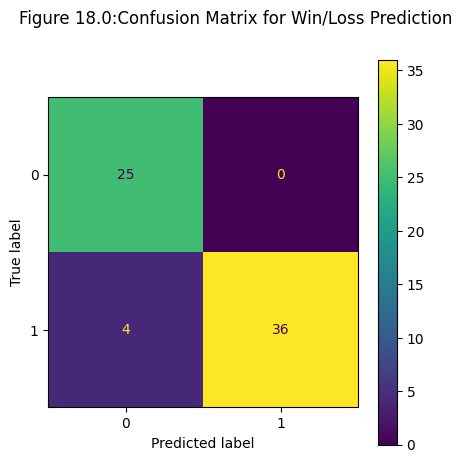

In [31]:
cm_win_loss = confusion_matrix(y_test_win_loss, y_pred_test_win_loss, labels=pipe_win_loss.classes_)
disp_win_loss = ConfusionMatrixDisplay(confusion_matrix=cm_win_loss,
                              display_labels=pipe_win_loss.classes_)
fig, ax = plt.subplots(figsize=(5, 5))
disp_win_loss.plot(ax=ax, colorbar=True);

fig.suptitle("Figure 18.0:Confusion Matrix for Win/Loss Prediction", fontsize=12, verticalalignment='top')
plt.show()

Bet Smart shows impressive performance across various metrics. With an accuracy of 93.85%, it correctly predicts match outcomes most of the time. A precision of 93.10% ensures reliable win predictions, ideal for betting. With a recall of 95.00%, the model captures most actual wins, minimizing missed prediction.

In [32]:
best_model_win_loss = pipe_win_loss.fit(X_win_loss, y_win_loss)

<h3 style="color:#fff; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;"> Grid Search (Set Outcome) </h3>

![Cover Image](data_pipeline_2.png)

The best-performing model, determined by grid search, was a `GradientBoostingClassifier` with specific hyperparameters `(max_depth=2, n_estimators=200)`. This model was trained on the entire training-validation dataset and evaluated on the test set. Precision, recall, and accuracy scores were computed to assess the model's performance. 

In [33]:
label_encoder = LabelEncoder()

target = 'Results'

df_agg_matches_encoded = df_agg_matches.copy()
X = df_agg_matches.copy()
X.drop(columns=['Team1', 'Team2', target], inplace=True)
y =  label_encoder.fit_transform(df_agg_matches_encoded[target])

result_label_dict = dict(zip(label_encoder.transform(label_encoder.classes_), label_encoder.classes_))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1337)

pipe_set = Pipeline([
    ('scaler', RobustScaler()),
    ('clf', None)
])

grid_search = GridSearchCV(
    estimator=pipe_set,
    param_grid=param_grid,
    cv=10,
    scoring='accuracy',
    n_jobs=-1,
    return_train_score=True
)

# COMMENTED THIS OUT - Note that there will be some randomness on the estimators and max_depth
# grid_search.fit(X_train, y_train)
# print(f"The best model is: {grid_search.best_params_}")
# print(f"with a accuracy score of: {grid_search.best_score_}")

# results = grid_search.cv_results_
# scores_df = pd.DataFrame(results)
# df_display = scores_df.sort_values(by='rank_test_score').head(10)
# df_display = df_display.style.set_caption("<h4><b>Table 11.0: Gridsearch Results for Best Model</b></h4>")
# df_display.set_table_styles([{
#     'selector': 'th',
#     'props': [('text-align', 'center'), ('min-width', '100px')]
# }, {
#     'selector': 'td',
#     'props': [('text-align', 'center'), ('min-width', '100px')]
# }, {
#     'selector': '',
#     'props': [('margin-left', 'auto'), ('margin-right', 'auto')]
# }])

In [34]:
pipe_set = Pipeline([
    ('scaler', RobustScaler()),
    ('classifier', GradientBoostingClassifier(max_depth=2, n_estimators=200, random_state=1337))
])

# Train the model using the training-validation dataset
pipe_set.fit(X_train, y_train)

Pipeline(steps=[('scaler', RobustScaler()),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, n_estimators=200,
                                            random_state=1337))])

In [35]:
y_pred_test = pipe_set.predict(X_test)

precision = precision_score(y_test, y_pred_test, average=None)
recall = recall_score(y_test, y_pred_test, average=None)
f1 = f1_score(y_test, y_pred_test, average=None)
accuracy = accuracy_score(y_test, y_pred_test)

print(f"Average Precision Score on the test set: {np.mean(precision):.4f}")
print(f"Average Recall Score on the test set: {np.mean(recall):.4f}")
print(f"Average F1 Score on the test set: {np.mean(f1):.4f}")
print(f"Accuracy Score on the test set: {accuracy:.4f}")

Average Precision Score on the test set: 0.7380
Average Recall Score on the test set: 0.7125
Average F1 Score on the test set: 0.7167
Accuracy Score on the test set: 0.7320


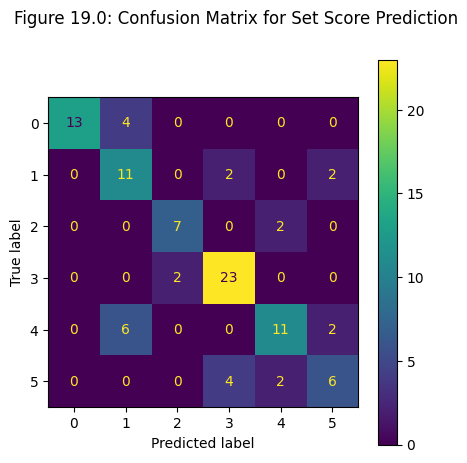

In [36]:
cm_set = confusion_matrix(y_test, y_pred_test, labels=pipe_set.classes_)
disp_set = ConfusionMatrixDisplay(confusion_matrix=cm_set,
                              display_labels=pipe_set.classes_)

fig, ax = plt.subplots(figsize=(5, 5))  # Adjust the figsize as needed
disp_set.plot(ax=ax, colorbar=True);

fig.suptitle("Figure 19.0: Confusion Matrix for Set Score Prediction", fontsize=12, verticalalignment='top')
plt.show()

Compared to Bet Smart, Bet Smarter's model performance went down across all metrics and this is primarily because this model predicts more outcomes compared to the previous model, which is just a simple win-lose prediction.

In [37]:
best_model_set = pipe_set.fit(X, y)

<h3 style="color:#fff; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;"> Interpretability </h3>

To gain insights into the model's predictions, SHAP (SHapley Additive exPlanations) was employed, providing explanations for individual predictions.  

A summary plot was generated to visualize the feature importance, showcasing the top features contributing to the model's predictions. Additionally, SHAP distributions for the top 15 features were plotted individually, allowing for a detailed examination of each feature's impact on the model's output. These visualizations aid in understanding the model's decision-making process and identifying influential features in predicting match outcomes. 

In [38]:
shap_explainer = shap.Explainer(pipe_set.predict_proba, X_train, feature_names=X_train.columns)
shap_values = shap_explainer(X_test)

PermutationExplainer explainer: 98it [00:51,  1.70it/s]                                                                                                                                                           


In [39]:
shap_explanation = shap.Explanation(shap_values.values[:, :, 1],
                                    shap_values.base_values[0][1],
                                    shap_values.data,
                                    feature_names=X_test.columns)

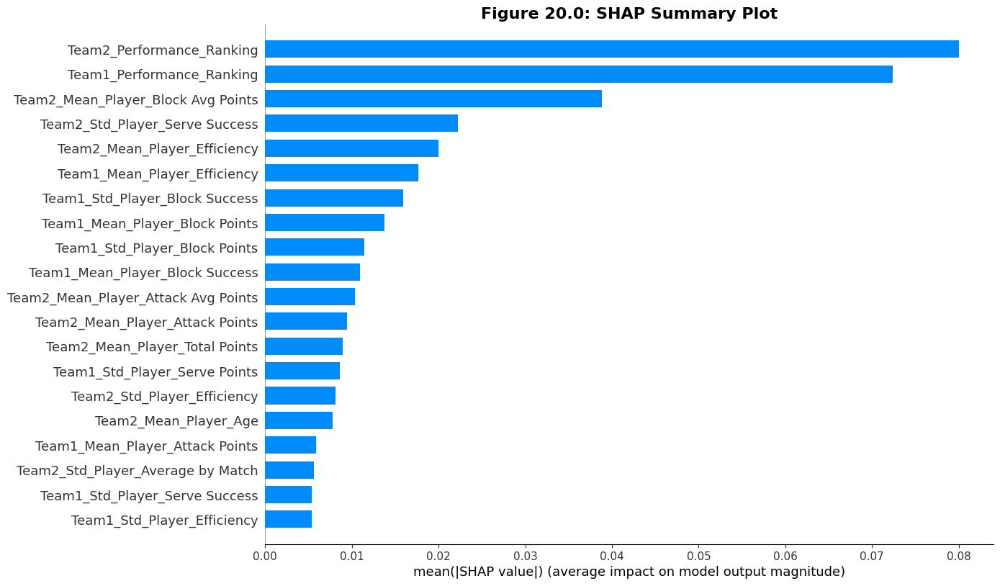

In [40]:
shap.summary_plot(shap_explanation, plot_type='bar', plot_size=(14, 8), show=False)

plt.title("Figure 20.0: SHAP Summary Plot", fontsize=16, fontweight='bold')
plt.show()

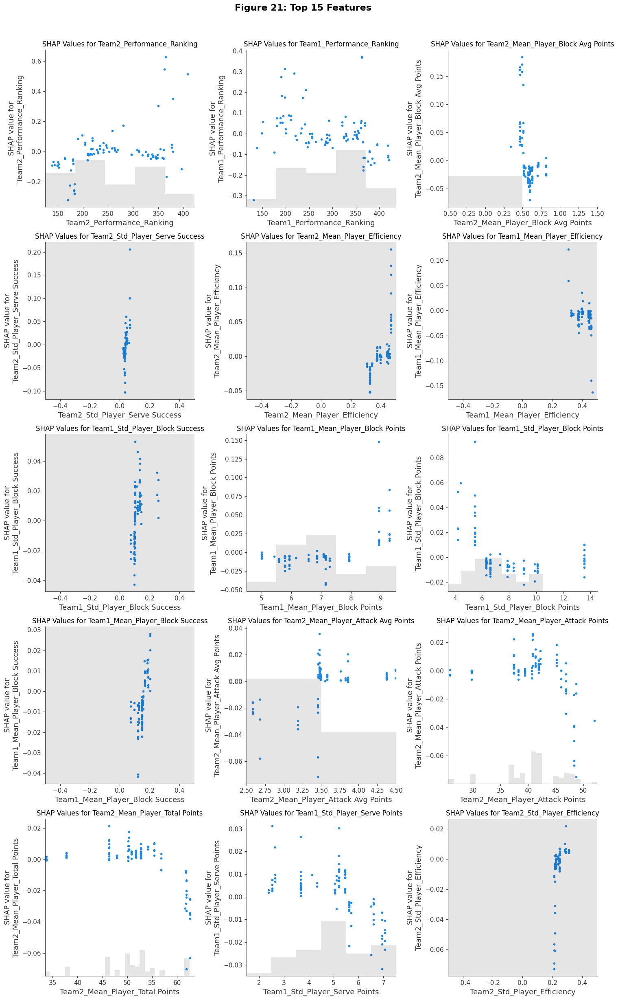

In [41]:
# Graphing Shap distribution for feature
top_15_features = np.abs(shap_explanation.values).mean(axis=0).argsort()[::-1][:15]

fig, axes = plt.subplots(5, 3, figsize=(15, 25))

# Iterate over each feature for rows
for i, feature in enumerate(top_15_features):
    row_index = i // 3
    col_index = i % 3
    shap.plots.scatter(shap_explanation[:, feature], ax=axes[row_index, col_index], show=False)
    axes[row_index, col_index].set_title(f"SHAP Values for {X.columns[feature]}")


plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.suptitle('Figure 21: Top 15 Features', fontsize=16, fontweight='bold')
plt.show()

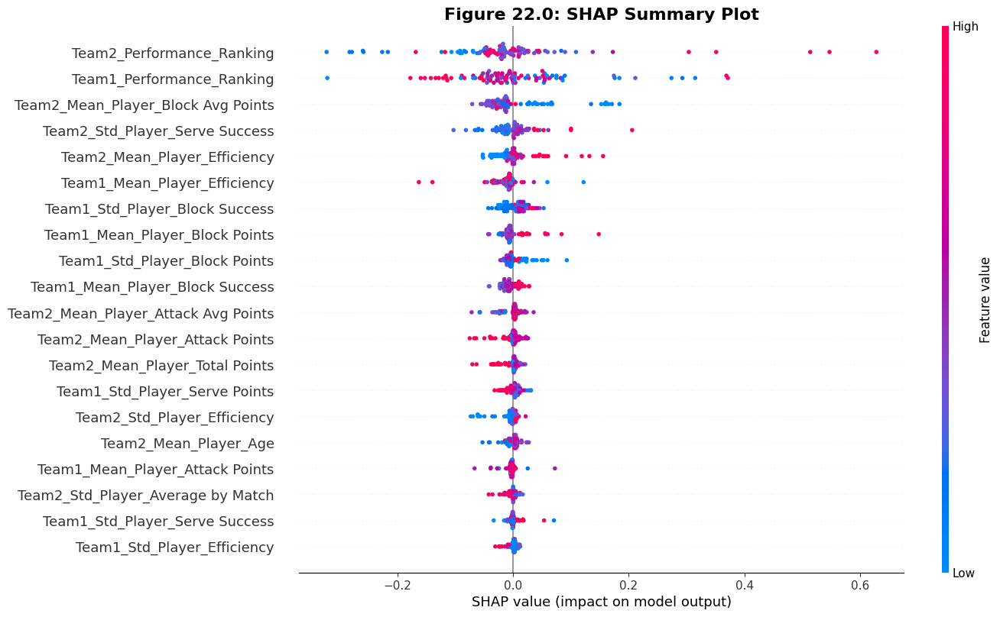

In [42]:
shap.summary_plot(shap_explanation, plot_size=(14, 8), show=False)

plt.title("Figure 22.0: SHAP Summary Plot", fontsize=16, fontweight='bold')
plt.show()

<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;"> 2024 Predictions </h1>

To anticipate match outcomes for the 2024 Volleyball Nations League (VNL), several steps were undertaken. Initially, team rosters for 2024 were scraped and transformed into a suitable format for modeling. Utilizing historical data from the 2023 VNL season, a function was developed to generate sample match data based on the team profiles extracted from the rosters. This data was then passed through the trained machine learning model to predict match outcomes, providing valuable insights into potential winners. 

In [43]:
# Updated country names to country codes
country_codes_2024 = {
    'Argentina': 'ARG',
    'Brazil': 'BRA',
    'Bulgaria': 'BUL',
    'Canada': 'CAN',
    'Cuba': 'CUB',
    'France': 'FRA',
    'Germany': 'GER',
    'Iran': 'IRI',
    'Italy': 'ITA',
    'Japan': 'JPN',
    'Netherlands': 'NED',
    'Poland': 'POL',
    'Serbia': 'SRB',
    'Slovenia': 'SLO',
    'USA': 'USA',
    'Turkey': 'TUR'
}

In [44]:
df_2024_rosters = pd.read_csv('data/df_mens_rosters_24.csv')

In [45]:
# Converting to float
columns_to_float = [
    'No.', 'Age', 'Height', 'Total Points', 'Average by Match', 'Attack Points', 
    'Attack Avg Points', 'Block Points', 'Block Avg Points', 'Serve Points', 'Serve Avg Points'
]

for col in columns_to_float:
    df_2024_rosters[col] = pd.to_numeric(df_2024_rosters[col], errors='coerce')

# Converting Player_ID to object (string)
df_2024_rosters['Player_ID'] = df_2024_rosters['Player_ID'].astype(str)

# Removing '%' and converting to float for specific columns
percentage_columns = ['Efficiency', 'Block Success', 'Serve Success']
for col in percentage_columns:
    df_2024_rosters[col] = df_2024_rosters[col].replace('-', '0')  # Replace '-' with '0'
    df_2024_rosters[col] = df_2024_rosters[col].str.rstrip('%').astype(float) / 100

In [46]:
df_2024_rosters = df_2024_rosters[df_2024_rosters['Position'] != 'COACH']
df_2024_rosters.fillna(0, inplace=True)

In [47]:
# Drop irrelevant columns
df_filtered = df_2024_rosters.drop(columns=[
    'No.', 'Year', 'Player Name', 'Player_ID', 'Nationality'
])

# Group by 'Country_Name'
grouped = df_filtered.groupby('Country_Name')

# Aggregate numerical data by mean and standard deviation
numerical_stats = grouped.mean().add_prefix('Mean_Player_').join(grouped.std().add_prefix('Std_Player_'))
df_2024_team_profile = numerical_stats.copy() 

# Reset index
df_2024_team_profile.reset_index(inplace=True)

# Replace country names with country codes
df_2024_team_profile['Country_Name'] = df_2024_team_profile['Country_Name'].replace(country_codes_2024)

df_display = df_2024_team_profile

df_display.style.set_caption(
    "Table 10.0: 2024 Country Team Profiles"
    ).set_table_styles([{
    'selector': 'caption',
    'props': [('text-align', 'center'), 
              ('font-size', '110%'), 
              ('font-weight', 'bold')]
}])

,Country_Name,Mean_Player_Age,Mean_Player_Height,Mean_Player_Total Points,Mean_Player_Average by Match,Mean_Player_Attack Points,Mean_Player_Efficiency,Mean_Player_Attack Avg Points,Mean_Player_Block Points,Mean_Player_Block Success,Mean_Player_Block Avg Points,Mean_Player_Serve Points,Mean_Player_Serve Success,Mean_Player_Serve Avg Points,Std_Player_Age,Std_Player_Height,Std_Player_Total Points,Std_Player_Average by Match,Std_Player_Attack Points,Std_Player_Efficiency,Std_Player_Attack Avg Points,Std_Player_Block Points,Std_Player_Block Success,Std_Player_Block Avg Points,Std_Player_Serve Points,Std_Player_Serve Success,Std_Player_Serve Avg Points
0,ARG,28.357143,194.642857,15.214286,5.070714,12.285714,0.314586,4.095000,2.500000,0.133014,0.833571,0.428571,0.016407,0.142143,3.671243,9.017992,14.900586,4.967682,12.694206,0.254487,4.231913,3.156190,0.123170,1.053000,0.646206,0.028271,0.215127
1,BRA,30.642857,183.642857,15.357143,6.000000,12.928571,0.401600,5.000714,1.500000,0.093550,0.618571,0.928571,0.032043,0.380714,5.400956,52.773255,14.663440,5.476758,13.193613,0.271096,4.813336,1.556624,0.093607,0.758367,1.268814,0.036000,0.564153
2,BUL,23.285714,200.071429,11.642857,3.881429,9.142857,0.340579,3.047857,1.428571,0.061993,0.476429,1.071429,0.030036,0.357143,4.530725,8.606476,14.430775,4.810858,12.196198,0.318115,4.065166,2.651974,0.102184,0.884435,1.730464,0.050784,0.577121
3,CAN,27.571429,197.500000,18.714286,4.678571,14.642857,0.383329,3.660714,2.285714,0.159586,0.571429,1.785714,0.046721,0.446429,2.927700,10.522869,23.173023,5.793256,19.649260,0.312579,4.912315,2.785362,0.256843,0.696341,2.259291,0.056048,0.564823
4,CUB,27.071429,195.642857,22.642857,5.660714,17.142857,0.322793,4.285714,3.714286,0.128314,0.928571,1.785714,0.036121,0.446429,4.859001,9.220438,27.286534,6.821634,21.989008,0.269010,5.497252,4.794686,0.151433,1.198671,2.665407,0.045493,0.666352
5,FRA,28.857143,197.571429,13.428571,3.505714,10.142857,0.353050,2.655000,1.785714,0.139857,0.452143,1.500000,0.043286,0.398571,4.276180,8.262187,13.019006,3.439208,10.861769,0.287620,2.864606,2.082106,0.113727,0.518640,2.066212,0.051429,0.553477
6,GER,26.285714,197.142857,12.357143,4.119286,10.285714,0.390821,3.427857,1.357143,0.080893,0.452857,0.714286,0.023093,0.237857,4.140393,8.483986,12.845874,4.281852,10.992505,0.306632,3.663536,2.373156,0.112254,0.792381,1.138729,0.041025,0.379740
7,IRI,25.214286,198.000000,10.857143,4.035714,8.785714,0.288979,3.297143,1.000000,0.056971,0.368571,1.071429,0.047843,0.369286,4.191173,7.666109,12.346642,5.156532,10.526001,0.250747,4.483536,1.568929,0.094029,0.584661,1.141139,0.055442,0.382833
8,ITA,24.714286,196.000000,13.214286,4.405000,9.571429,0.283629,3.190714,2.500000,0.121157,0.832857,1.142857,0.025200,0.381429,3.561084,10.114727,17.572612,5.857476,13.437687,0.303872,4.479161,3.458546,0.153187,1.152999,2.413333,0.048328,0.805690
9,JPN,26.928571,189.785714,18.071429,4.517857,14.714286,0.390321,3.678571,2.000000,0.110314,0.500000,1.357143,0.034571,0.339286,3.950935,10.452667,17.008886,4.252221,14.777470,0.289432,3.694368,2.287087,0.092375,0.571772,2.307418,0.052683,0.576854


In [48]:
# Get their current points
df_2023_standings = pd.read_csv('data/vnl_2023_current_standing.csv')

<h2 style="color:#4d0077; text-align:left; text-transform: uppercase;"> Sample Match </h2>

For predicting outcomes based on team profiles and match data, several functions were created. The process involves preparing team data, merging and cleaning this data, making predictions using models, and converting labels into usable formats.

1. **Prepare Team Data**:
    - Gather and organize profiles for both teams.
    - Combine their standings information.<br><br>

2. **Merge and Clean Data**:
    - Integrate team profiles with standings.
    - Remove redundant information and organize data for clarity.<br><br>

3. **Predict Match Outcomes**:
    - Use pre-trained models to predict set outcomes and win/loss outcomes<br><br>

In [49]:
def createMatchRecord(team1, team2, team_profile):
    # Add suffixes to the columns of df_team_profile
    df_team_profile_team1 = team_profile[team_profile['Country_Name'] == team1].add_prefix('Team1_')
    df_team_profile_team2 = team_profile[team_profile['Country_Name'] == team2].add_prefix('Team2_')
    
    df_2023_standings_team1 = df_2023_standings[df_2023_standings['Team'] == team1].rename(columns={'Team': 'Team1', 'Points': 'Team1_Performance_Ranking'})
    df_2023_standings_team2 = df_2023_standings[df_2023_standings['Team'] == team2].rename(columns={'Team': 'Team2', 'Points': 'Team2_Performance_Ranking'})
    df_2023_standings_team1.index = [0]
    df_2023_standings_team2.index = [0]
    df_match = df_2023_standings_team1.merge(df_2023_standings_team2, how='outer', left_index=True, right_index=True)
    
    # Merge df_matches with df_team_profile for Team 1
    df_match = pd.merge(df_match, df_team_profile_team1, left_on='Team1', right_on='Team1_Country_Name', how='left')
    
    # Merge df_matches with df_team_profile for Team 2
    df_match = pd.merge(df_match, df_team_profile_team2, left_on='Team2', right_on='Team2_Country_Name', how='left')


    df_match.drop(columns=['Team1_Country_Name', 'Team2_Country_Name'], inplace=True)
    
    # Get column names starting with 'Team1_'
    team1_columns = [col for col in df_match.columns if col.startswith('Team1')]
    
    # Get column names starting with 'Team2_'
    team2_columns = [col for col in df_match.columns if col.startswith('Team2')]
    
    # Reorder columns
    new_columns_order = team1_columns + team2_columns 
    df_match = df_match[new_columns_order]
    df_match.drop(columns=['Team1', 'Team2'], inplace=True)
    return df_match, df_team_profile_team1, df_team_profile_team2


def predictMatchSet(match):
    result =  best_model_set.predict(match)
    return label_encoder.inverse_transform([result[0]])[0]


def predictMatchWin(match):
    result =  best_model_win_loss.predict(match)
    return label_encoder_win_loss.inverse_transform([result[0]])[0]


def getLabelClassSet(label):
    return int(label_encoder.transform([label])[0])


def getLabelClassWin(label):
    return int(label_encoder_win_loss.transform([label])[0])

For instance, considering a hypothetical match between Cuba (CUB) and Japan (JPN), the model predicted a set outcome of 1 - 3 in favor of Japan. 
 

In [50]:
team1 = 'CUB'
team2 = 'JPN'

match, team1_profile, team2_profile = createMatchRecord(team1, team2, df_2024_team_profile)

In [51]:
# Using set outcome model
set_outcome = predictMatchSet(match)
print(f'Predicted Set Outcome for Team 1 ({team1}) vs Team 2 ({team2}): {set_outcome}')
print(f'Predicted Set Winner: {team1 if getLabelClassSet(set_outcome) > 2 else team2}')

Predicted Set Outcome for Team 1 (CUB) vs Team 2 (JPN): 1 - 3
Predicted Set Winner: JPN


In [52]:
# Using Win-Loss Model
win_outcome = predictMatchWin(match)
print(f'Predicted Win Outcome for Team 1 ({team1}) vs Team 2 ({team2}): {team1 if getLabelClassWin(win_outcome) == 1 else team2}')

Predicted Win Outcome for Team 1 (CUB) vs Team 2 (JPN): JPN


<h2 style="color:#4d0077; text-align:left; text-transform: uppercase;"> Model Explainability </h2>

To further interpret the model's predictions, interpretability tools such as SHAP (SHapley Additive exPlanations) and LIME (Local Interpretable Model-agnostic Explanations) were employed.  

These explanations bolster user confidence by providing insights into how the model operates, ensuring transparency and understanding. 
 

SHAP was utilized to visualize the contribution of each feature towards the model's predictions, offering insights into the key factors influencing match outcomes. Additionally, a waterfall plot was generated to illustrate the impact of individual features on the predicted outcome. 

In [53]:
shap_explainer_match = shap.Explainer(
    best_model_set.predict_proba, X, feature_names=X.columns)

shap_values_match = shap_explainer_match(match)

shap_explanation_match = shap.Explanation(
    shap_values_match.values[:, :, 1],
    shap_values_match.base_values[0][1],
    shap_values_match.data,
    feature_names=X.columns
)

Using SHAP for model interpretability reveals key insights into the match outcome between Cuba and Japan. One of the most significant factors that affected the prediction was Japan's high performance ranking from the previous year. This ranking captures their strong historical performance.

On the other hand, Cuba's weaknesses, particularly their low block points, further tipped the balance in favor of Japan. 

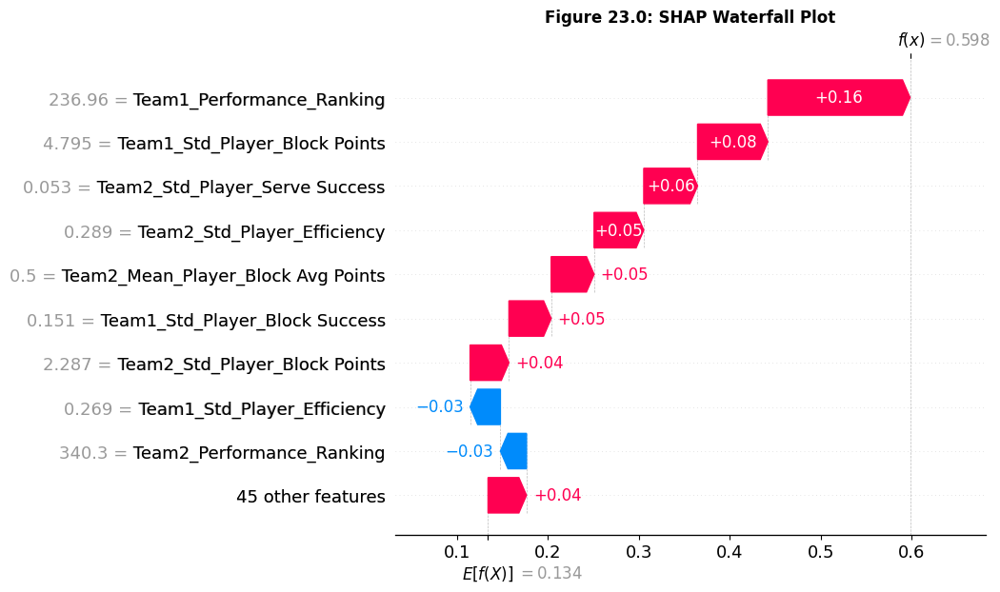

In [54]:
shap.plots.waterfall(shap_explanation_match[0], show=False)

plt.title("Figure 23.0: SHAP Waterfall Plot", fontsize=12, fontweight='bold')
plt.show()

Lastly, LIME (Local Interpretable Model-agnostic Explanations) was utilized to provide local explanations for individual match predictions, offering transparency into the model's decision-making process. These interpretability techniques enhance the transparency and trustworthiness of the predictive models, enabling stakeholders to make informed decisions based on the model's insights. 

In [55]:
lime_explainer = LimeTabularExplainer(
    X.to_numpy(),
    feature_names=X.columns
)
lime_explanation = lime_explainer.explain_instance(
    match.iloc[0],
    best_model_set.predict_proba,
    num_features=10
)

lime_html = lime_explanation.as_html()

custom_html = f"""
<div style='text-align: center; margin-bottom: 20px;'>
    <<h2 style='font-size: 16px; 'font-weight: bold'>Figure 22.0: LIME Explanation for Features</h2>
</div>
{lime_html}
"""

# Display the custom HTML in the notebook
display(HTML(custom_html))

The LIME analysis reveals that the model predicts a 60% chance that Japan will win the match with a score of 1 - 3. This is the highest probability, indicating that the model strongly believes Japan is likely to win.

The second highest probability is 17%, predicting that Cuba might win with a score of 3 - 2. This suggests that while Japan is favored, there is still a chance that Cuba could win in a close match.

<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;"> RESULTS </h1>

<h2 style="color:#4d0077; text-align:left; text-transform: uppercase;"> Testing June 5 Matches </h2>

To test the our model, we tried to predict and explain match outcomes between two teams. 

<p style="text-align: center;"><strong>Table 11.0: June 5 Matches Prediction Summary</strong></p>

|   Team 1   |   Team 2   | Prediction Team Won | Prediction Set Score | Actual Team Won | Actual Set Score | Match Outcome |
|:----------:|:----------:|:-------------------:|:--------------------:|:---------------:|:----------------:|:-------------:|
|    ARG     |    USA     |         ARG         |          3-0         |       USA       |        0-3       |       ❌      |
|    CAN     |    CUBA    |         CAN         |          3-0         |       CAN       |        3-1       |     ✅     |
|    SLO     |    TUR     |         SLO         |          3-0         |       SLO       |        3-0       |     ✅✅     |
|    GER     |    JPN     |         GER         |          3-3         |       JPN       |        2-3       |       ❌       |



In [56]:
def test_predict_with_explanation(team1, team2, figure_number):
    match, team1_profile, team2_profile = createMatchRecord(team1, team2, df_2024_team_profile)
    win_outcome = predictMatchWin(match)
    set_outcome = predictMatchSet(match)
    
    print(f'Predicted Win Model Outcome for Team 1 ({team1}) vs Team 2 ({team2}): {team1 if getLabelClassWin(win_outcome) == 1 else team2}')
    print(f'Predicted Set Model Outcome for Team 1 ({team1}) vs Team 2 ({team2}): {set_outcome} ({team1 if getLabelClassSet(set_outcome) > 2 else team2})')
    
    lime_explanation_match = lime_explainer.explain_instance(
        match.iloc[0],
        best_model_set.predict_proba,
        num_features=5
    )
    
    lime_html = lime_explanation_match.as_html(show_all=False)

    # Create custom HTML with a dynamic title based on parameters
    custom_html = f"""
    <div style='text-align: center; margin-bottom: 20px;'>
        <h2 style='font-size: 18px; font-weight: bold;'>Figure {figure_number}: Explanation for Features - {team1} vs {team2}</h2>
    </div>
        <div style='text-align: center; margin-bottom: 20px;'>
        <h3 style='font-size: 16px; font-weight: semibold;'>LIME Explanation for Top 5 Features</h2>
    </div>
    {lime_html}

     </div>
        <div style='text-align: center; margin-top: 20px;'>
        <h3 style='font-size: 16px; font-weight: semibold;'>SHAP Explanation Top 5 Features</h2>
    </div>
    """

    # Display the custom HTML in the notebook
    display(HTML(custom_html))

     # SHAP explanation
    shap_explainer_match = shap.Explainer(best_model_set.predict_proba, X, feature_names=X.columns)
    
    shap_values_match = shap_explainer_match(match)

    shap_explanation_match = shap.Explanation(
        shap_values_match.values[:, :, 1],
        shap_values_match.base_values[0][1],
        shap_values_match.data,
        feature_names=X.columns
    )
    shap.plots.waterfall(shap_explanation_match[0],  max_display=6, show=False)
    plt.tight_layout()
    plt.show()

Predicted Win Model Outcome for Team 1 (ARG) vs Team 2 (USA): ARG
Predicted Set Model Outcome for Team 1 (ARG) vs Team 2 (USA): 3 - 0 (ARG)


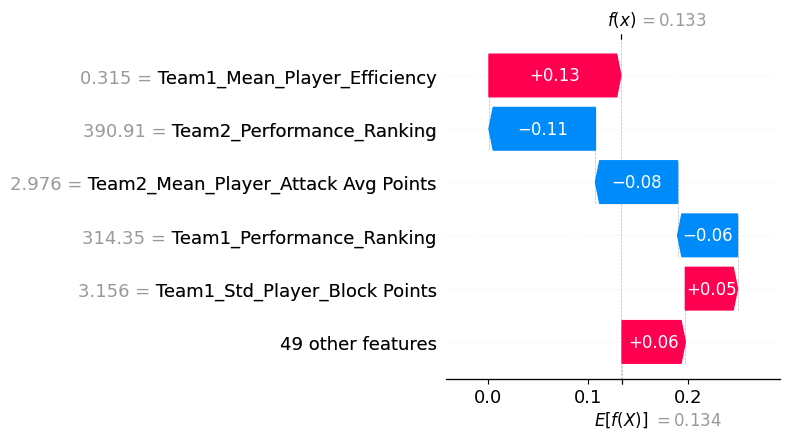

In [57]:
team1 = 'ARG'
team2 = 'USA'
figure_number = '25.0'

test_predict_with_explanation(team1, team2, figure_number)

<div class="alert alert-success">

#### Interpretation:
- The model predicted ARG to win based on higher player efficiency and positive variability in block points.
- Team USA’s higher performance ranking and attack points negatively influenced ARG's chances, leading to the actual outcome of USA winning the match 3-0.
</div>

Predicted Win Model Outcome for Team 1 (CAN) vs Team 2 (CUB): CUB
Predicted Set Model Outcome for Team 1 (CAN) vs Team 2 (CUB): 3 - 0 (CAN)


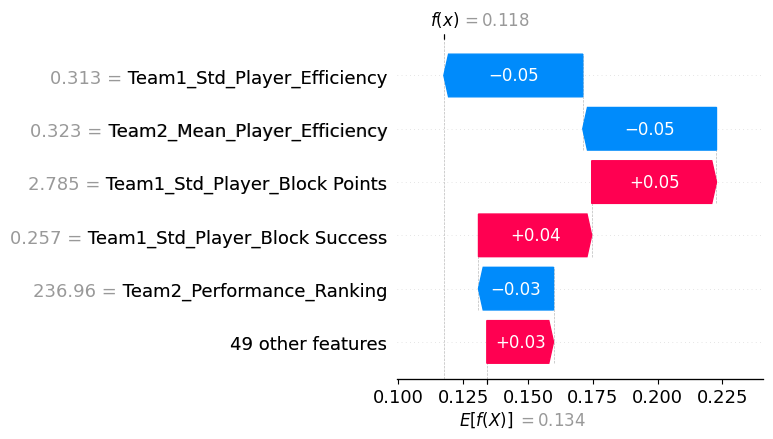

In [58]:
team1 = 'CAN'
team2 = 'CUB'
figure_number = '26.0'

test_predict_with_explanation(team1, team2, figure_number)

<div class="alert alert-success">

#### Interpretation:
- The model predicted CAN to win based on higher player efficiency and strong blocking performance.
- Team CUBA’s performance ranking and player efficiency contributed negatively but were not sufficient to overcome CAN’s advantages, leading to the actual outcome of CAN winning the match 3-1.
</div>

Predicted Win Model Outcome for Team 1 (SLO) vs Team 2 (TUR): SLO
Predicted Set Model Outcome for Team 1 (SLO) vs Team 2 (TUR): 3 - 0 (SLO)


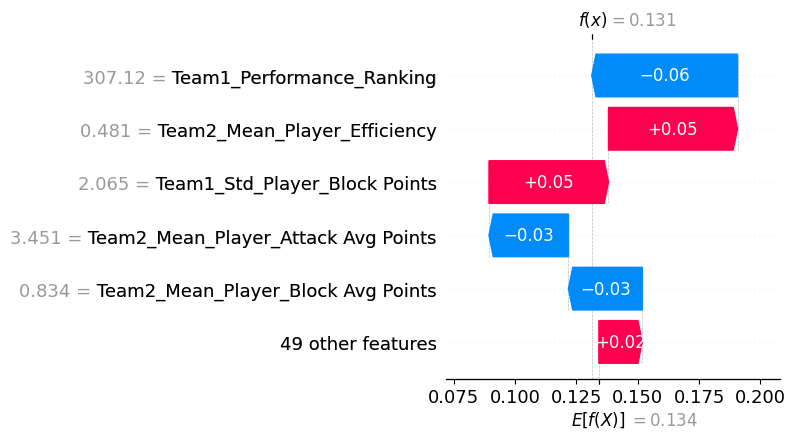

In [59]:
team1 = 'SLO'
team2 = 'TUR'
figure_number = '27.0'

test_predict_with_explanation(team1, team2, figure_number)

<div class="alert alert-success">

#### Interpretation:
- The model predicted SLO to win based on higher performance ranking and positive variability in block points.
- Team TUR’s attack points and player efficiency negatively influenced SLO's chances but were not enough to change the predicted outcome, leading to the actual result of SLO winning the match 3-0.
</div>

In [ ]:
team1 = 'GER'
team2 = 'JPN'
figure_number = '28.0'

test_predict_with_explanation(team1, team2, figure_number)

Predicted Win Model Outcome for Team 1 (GER) vs Team 2 (JPN): GER
Predicted Set Model Outcome for Team 1 (GER) vs Team 2 (JPN): 3 - 2 (GER)


<div class="alert alert-success">

#### Interpretation:
- The model predicted GER to win based on higher block points and performance ranking.
- Team JPN’s performance ranking and block average points negatively influenced GER's chances but were not enough to change the predicted outcome, leading to the actual result of JPN winning the match 3-2.
</div>

#### Concluding Interpretation:


**Correct Predictions** 
- The model successfully predicted the outcomes of matches CAN vs CUBA and SLO vs TUR. The key features contributing to these correct predictions included higher player efficiency, stronger performance metrics, and positive variability in block points for the winning teams.

**Incorrect Predictions**
- For the matches ARG vs USA and GER vs JPN, the model's predictions were incorrect. The SHAP and LIME explanations indicated that factors such as higher performance ranking and player efficiency for the opposing teams negatively influenced the predicted winning chances of ARG and GER.

**External Factors** 
- It is important to note that external factors not captured by the model, such as player injuries, team strategies, psychological factors, and real-time decisions made during the game, can significantly influence the actual match outcomes. These factors contribute to the discrepancies between the predicted and actual results.

**Model Reliability** 
- While the model demonstrates good predictive capabilities in some instances, incorporating additional external variables and refining the feature set can enhance its accuracy. Future improvements could involve integrating real-time data and more comprehensive player and team statistics to account for these external influences.

---

<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;"> Linking Bet Smart and Betting Odds </h1>

Bet Smart, which predicts if a team will win or lose, can be used to drive decisions when it comes to betting odds. For example, in the match between Slovenia and Türkiye, the model predicts that Slovenia will win. Furthermore, model interpretability through SHAP can give the more insight on which factor contributed the most to Slovenia’s win. Table 12.0 shows how the betting odds will look like upon being influenced by Bet Smart predictions. 

<p style="text-align: center;"><strong>Table 12.0. Win-Lose Level Betting Odds Influenced by Bet Smart</strong></p>

<div style="display: flex; justify-content: center;">
<table border="1" style="width: 50%;">
  <tr>
    <th colspan="4", style="text-align: left;">Winner</th>
  </tr>
  <tr>
    <td>Slovenia</td>
    <td style="text-align: center;">1.05</td>
    <td>Türkiye</td>
    <td style="text-align: center;">9.2</td>
  </tr>
</table>
</div>

The Bet Smart model prediction and SHAP model interpretability, together with domain expertise, can increase the confidence of the sports betting operator that Slovenia will win. With this, the stake for Türkiye can be set to a higher number since the operators want people to bet on the weaker team, which is Türkiye. In this way, the betting odds will be more attractive for the bettors since their bet amount will be 9.2 times higher if ever Türkiye wins. This exercises the idea of high risk, high reward. 

In the sports betting industry, especially for volleyball enthusiasts, people already have a notion of which team will win. Bettors who investigate volleyball game statistics know that Slovenia has a higher rank compared to Türkiye. This is why bettors also have an option to bet on a set level where they can bet on which team will win at every set of the game towards the fifth set. In this way, betting becomes more exciting since the concept of chance comes into play. Given this context, Bet Smarter will come in handy. 

Bet Smarter has the capability to predict at which set will a team win. Since this model's accuracy is weaker than Bet Smart, LIME model interpretability can aid in the formulation of betting odds. Table 12.1 shows the prediction probability of the top 4 outcomes of Bet Smarter is visible through LIME.

<p style="text-align: center;"><strong>Table 12.1. LIME Prediction Probability for SLO vs. TUR</strong></p>

<div style="display: flex; justify-content: center;">
<table border="1">
  <tr>
    <th colspan="2" style="text-align: center;">Outcome</th>
    <th colspan="2" style="text-align: center;">Prediction Probability</th>
  </tr>
  <tr>
    <td colspan="2" style="text-align: center;">3 - 0</td>
    <td colspan="2" style="text-align: center;">43%</td>
  </tr>
  <tr>
    <td colspan="2" style="text-align: center;">3 - 1</td>
    <td colspan="2" style="text-align: center;">21%</td>
  </tr>
  <tr>
    <td colspan="2" style="text-align: center;">3 - 2</td>
    <td colspan="2" style="text-align: center;">20%</td>
  </tr>
  <tr>
    <td colspan="2" style="text-align: center;">0 - 3</td>
    <td colspan="2" style="text-align: center;">13%</td>
  </tr>
  <tr>
    <td colspan="2" style="text-align: center;">Other</td>
    <td colspan="2" style="text-align: center;">3%</td>
  </tr>
</table>
</div>

Through the prediction probabilities, the sports betting operator has an idea of the model’s confidence in predicting a specific outcome. From Table 12.1, it can be observed that a 3-0 outcome has a less than 50% prediction probability. With this, the other outcomes should be considered. Since there is a possibility that Türkiye can win at any of the first three sets, the betting odds can be formulated in a way that makes people bet even more. Table 12.2 shows how this can be achieved. 

<p style="text-align: center;"><strong>Table 12.2. Set Level Betting Odds Influenced by Bet Smarter</strong></p>

<div style="display: flex; justify-content: center;">
<table border="1" style="width: 50%;">
  <tr>
    <th colspan="4" style="text-align: left;">First set - winner</th>
  </tr>
  <tr>
    <td style="text-align: left;">Slovenia</td>
    <td style="text-align: center;">1.16</td>
    <td style="text-align: left;">Türkiye</td>
    <td style="text-align: center;">5.0</td>
  </tr>
  <tr>
    <th colspan="4" style="text-align: left;">Second set - winner</th>
  </tr>
  <tr>
    <td style="text-align: left;">Slovenia</td>
    <td style="text-align: center;">1.7</td>
    <td style="text-align: left;">Türkiye</td>
    <td style="text-align: center;">3.0</td>
  </tr>
  <tr>
    <th colspan="4" style="text-align: left;">Third set - winner</th>
  </tr>
  <tr>
    <td style="text-align: left;">Slovenia</td>
    <td style="text-align: center;">1.8</td>
    <td style="text-align: left;">Türkiye</td>
    <td style="text-align: center;">2.85</td>
  </tr>
  <tr>
    <th colspan="4" style="text-align: left;">Fourth set - winner</th>
  </tr>
  <tr>
    <td style="text-align: left;">Slovenia</td>
    <td style="text-align: center;">1.9</td>
    <td style="text-align: left;">Türkiye</td>
    <td style="text-align: center;">2.5</td>
  </tr>
  <tr>
    <th colspan="4" style="text-align: left;">Fifth set - winner</th>
  </tr>
  <tr>
    <td style="text-align: left;">Slovenia</td>
    <td style="text-align: center;">2.0</td>
    <td style="text-align: left;">Türkiye</td>
    <td style="text-align: center;">1.9</td>
  </tr>
</table>
</div>

It can be observed from Table 12.2 that the odds become closer to each other as the sets of the game go on. In some cases, the betting odds become closer at the fourth set; however, since LIME prediction probability shows that there a chance that Türkiye will win at any of the first three sets, the betting odds become closer earlier on in the game. This explains how model interpretability through LIME influences the betting odds. 

Having betting odds on both teams close to each other at an early stage in the game increases the chance of people betting on more set matches. This is because the odds are more attractive and fun for the bettors, which is the essence of betting. Since sports betting operators get a minimum of 1% for every bet, whether the bettors win or not, their goal is to make people get hooked in betting. Through the power of model interpretability, the betting operator is more confident in giving a higher stake as this can increase customer engagement. 

<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;"> Recommendations</h1>

In improving the predictive models for the Volleyball Nations League (VNL), we have identified some possible areas of enhancement. These recommendations aim to fine-tune our models to make them more accurate and effective, as well as add to the business value. 

 
1. **Regular update of team standings and player profiles**

   Given that player statistics and team standings update after each game, it is essential to implement real-time updates to the player profiles. However, it is important to acknowledge the limitations associated with player statistics for new or infrequently played individuals and the availability of their statistics on the VNL website. 
 

2. **Determine optimal timeline for retraining**

   Experiment with different retraining timelines to balance accuracy and computational resources, considering that there was an observed decrease in accuracy when including historical data from earlier seasons (2021-2022). This evaluation helps determine the optimal schedule for retraining predictive models. 
 

3. **Inclusion of temporal and qualitative features** 

    Recognizing the impact of factors such as player form, injuries, coaching strategies, win streaks, team morale, home-court advantage, and possibly even weather conditions on match outcomes is important. Integrating temporal and qualitative factors alongside historical data ensures a comprehensive analysis in predictive models.

    Consider incorporating lagged variables to capture momentum and performance trends to provide valuable context for future predictions. Moreover, explore additional qualitative factors for inclusion in predictive models that may increase accuracy and robustness in forecasting match outcomes. 

 

4. **Explore DICE counterfactuals for additional business value**

    Exploring DICE counterfactuals offers a methodological approach to identifying crucial performance factors that teams should prioritize to enhance their chances of success against specific opponents. By analyzing counterfactual scenarios, we can isolate the key features or strategies that contribute most significantly to favorable outcomes in matches against particular teams. This investigative process enables us to uncover actionable insights, such as areas for improvement or tactical adjustments, which teams can then focus on to increase their competitive edge. 

 

5. **Implementation of win outcome on set-level granularity**


    Considering the outcome of each set and focusing on the player profiles of the five players on the court can offer valuable insights into match dynamics and player contributions. Analyzing individual set outcomes provides a detailed understanding of team performance, highlighting patterns of success or struggle. Furthermore, examining the impact of the five players on court allows for assessment of their contribution to set outcomes and overall team success, subject to data availability. 

<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;"> Business Value</h1>

For teams and coaches, the predictive insights from our models provide valuable information on performance metrics, helping refine strategies and improve player performance. By understanding the factors influencing match outcomes, coaches can make data-driven decisions to enhance their teams' chances of success.

For prospective bettors, the innovative approach of this project and the model accuracy offers a compelling reason for prospective bettors to engage in sports betting. By providing transparent, easy to understand and reliable predictions, this project made the prediction more accessible and less intimidating for newcomers even to those who are not hard-core enthusiasts of the sport. 

For bettors, using relevant historical data for volleyball match outcomes and set scores to name a few, will enhance their ability to make data driven decisions. The results of this project will empower their decisions on strategically placing their bets rather than relying solely on intuition or incomplete information which wiill ultimately increase their chance of success and maximizing their returns. 

For betting platforms, this will provide them with an edge in the competitive sports betting market. Integrating machine learning methods, they can highlight high accurate forecasts of volleyball match outcomes enhancing user engagement and satisfaction. They may also consider using these analytics that will only be available for higher tier memberships on their platforms. 

For the sports betting industry, using these machine learning algorithms and data aggregation, the focus on interpretability ensures that the predictions are not only accurate but also understandable. This fosters trust and confidence among bettors and participants in the industry. This will further enhance the industry's reputation and attract a broader audience which will lead to a more reliable betting ecosystem. 

<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;"> Conclusion</h1>

In this project, we leveraged machine learning methodologies to predict the VNL match outcomes and set scores of the league. By developing predictive models through innovative machine learning methodologies such as Gradient Boost Classifier, Random Forest, and SVC to name a few. Adding hyperparameter optimization using grid search with cross validation, we have identified the best performing models and enhanced predictive accuracy for the outcome. The approach involves model interpretability using SHAP which aided in understanding the prediction process of the models used.

The project also leveraged the correlation between performance metrics such as the positive relationships between matches and sets won. By delivering data-driven predictions this will empower bettors to make well-informed decisions and optimize their strategies and prolong their engagements in the platform. Furthermore, this may also drive an increase in the profitability and competitiveness in the Sports Betting industry making this project a sound asset in enhancing the betting platforms to leverage data analytics for superior performance. The below considers the added value on different perspectives of in terms of business value of this project. 

<h1 style="color:#f6c13b; background-color:#4d0077; padding: 10px; text-align:left; border: 1px solid #4a62d8; text-transform: uppercase;"> References </h1>

[[1]](https://www.onesports.ph/alas/article/21663/in-photos-alas-pilipinas-makes-history-with-first-avc-medal-in-63-years ) In photos: Alas pilipinas makes history with first AVC medal in 63 years. OneSports.PH. (2024, May 30). https://www.onesports.ph/alas/article/21663/in-photos-alas-pilipinas-makes-history-with-first-avc-medal-in-63-years

[[2]](https://kinexon-sports.com/blog/volleyball-performance-tracking-in-action/) How Live Sports Data and Volleyball Analytics Help Players, Coaches and Fans. KINEXON. (n.d.). https://kinexon-sports.com/blog/volleyball-performance-tracking-in-action/

[[3]](https://www.zibtek.com/projects/volley-metrics) Maximizing Performance: Volley Metrics projects. Zibtek. (n.d.). https://www.zibtek.com/projects/volley-metrics

[[4]](https://kinexon-sports.com/blog/volleyball-analytics/) KINEXON Volleyball Analytics: A Revolution in Sports Data. KINEXON. (n.d.-b). https://kinexon-sports.com/blog/volleyball-analytics/

[[5]](https://www.avca.org/blog/the-guide-to-developing-an-analytics-strategy/) Street, J. (2021, July 13). The guide to developing an analytics strategy in volleyball. AVCA. https://www.avca.org/blog/the-guide-to-developing-an-analytics-strategy/

[[6]](www.statista.com/statistics/1186240/sports-betting-and-lottery-industry-market-size-global/) Statista. “Sports Betting and Lottery Industry Market Size Worldwide from 2019 to 2023.” Statista, 07 Sep. 2023, www.statista.com/statistics/1186240/sports-betting-and-lottery-industry-market-size-global/

[[8]](www.researchandmarkets.com/report/asia-pacific-sports-betting-market?utm_source=GNE&utm_medium=PressRelease&utm_code=p34ptw&utm_campaign=1953821+-+Asia-Pacific+Sports+Betting+Market+Report+2024-2030%2c+Featuring+Dafabet%2c+SBOBET%2c+1xBet%2c+TAB%2c+CrownBet%2c+UBET%2c+Sports+Toto+Malaysia%2c+Mansion88%2c+12BET+and+W88&utm_exec=carimspi) Research and Markets. “Asia-Pacific Sports Betting Market Report 2024-2030.” Research and Markets, 13 Dec. 2023, www.researchandmarkets.com/report/asia-pacific-sports-betting-market?utm_source=GNE&utm_medium=PressRelease&utm_code=p34ptw&utm_campaign=1953821+-+Asia-Pacific+Sports+Betting+Market+Report+2024-2030%2c+Featuring+Dafabet%2c+SBOBET%2c+1xBet%2c+TAB%2c+CrownBet%2c+UBET%2c+Sports+Toto+Malaysia%2c+Mansion88%2c+12BET+and+W88&utm_exec=carimspi

[[9]](www.linkedin.com/pulse/volleyball-betting-market-exploring-present-patterns-3i9wc/) LinkedIn. “Volleyball Betting Market: Exploring Present Patterns and Prospects for Growth 2031.” LinkedIn, 2023, www.linkedin.com/pulse/volleyball-betting-market-exploring-present-patterns-3i9wc/

[[10]](https://en.volleyballworld.com/volleyball/world-ranking/men) Volleyballworld.com. (n.d.). The official FIVB Men’s Volleyball World Ranking. volleyballworld.com. https://en.volleyballworld.com/volleyball/world-ranking/men

[[11]](https://en.volleyballworld.com/volleyball/competitions/volleyball-nations-league/teams/men/) Volleyballworld.com. (n.d.-b). VNL 2024 - men’s teams. volleyballworld.com. https://en.volleyballworld.com/volleyball/competitions/volleyball-nations-league/teams/men/

[[12]](https://github.com/ZakirPasha/Volleyball-Nations-League/blob/main/Mens/Men’s%20VNL%20Rosters.ipynb) ZakirPasha. (n.d.). Volleyball-nations-league/mens/men’s VNL rosters.ipynb at main · zakirpasha/volleyball-nations-league. GitHub. https://github.com/ZakirPasha/Volleyball-Nations-League/blob/main/Mens/Men’s%20VNL%20Rosters.ipynb